# Educate Without the Need to be an Elitist (Election 2022 PH) - Group 2

*Peter Santiago*<br>
*Joey Tuason*

24-May-2022: Initial commit to github. Next update should include additional plots and aesthetic changes due to the data-ink ratio used in the slide deck (should be black background not white).

## Problem Statement

In this presentation, we look at the demographics of each region and determine if there is a relationship between them in relation to the situation of education in the Philippines. Datasets for education are obtained in the link below:

https://openstat.psa.gov.ph/database

## Initial Step

### Load Data

In [1]:
# Tools for data reading and manipulation
import pandas as pd
import numpy as np

### Load Formatting

In [2]:
from IPython.display import display
pd.options.display.float_format = '{:,.2f}'.format

pd.set_option('display.max_rows', None) # show whole table when printing

### Load Machine Learning Pack

In [3]:
from scipy.stats import pearsonr

### Load Visualization Tools

In [4]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns


from matplotlib import rcParams, cycler
from matplotlib import cm

import matplotlib.patches as patches
import matplotlib.path as path
import matplotlib.ticker as ticker
import matplotlib.animation as animation
import matplotlib as mpl

!pip install sweetviz
import sweetviz as sv

#for tree map
import squarify

### Ignore Warnings

In [5]:
import warnings
warnings.filterwarnings("ignore")

## Datasets

### Main dataset

In [6]:
df = pd.read_csv('PRESIDENT PHILIPPINES-5587- RESULTS.csv')
reg_voters = pd.read_excel('2022 Registered Voters by Province_1652536100.xlsx') # used below


# # for checking
# popn = pd.read_csv('Population.csv', 
#                    encoding = 'latin1',
#                    skiprows = 1)
# inc = pd.read_csv('Income and Consumption.csv',
#                  skiprows = 2)
# #livestock = pd.read_json('Livestock and Poultry.json')
# region_coord = pd.read_csv('ph.csv') #https://simplemaps.com/data/ph-cities

### Education Datasets

In [7]:
# https://www.deped.gov.ph/alternative-learning-system/resources/facts-and-figures/datasets/

# number of public school teachers (tc)
educ_pubschoolteachers_elem = pd.read_excel('Historical-Number-of-Public-School-Teachers-in-All-Level-of-Education.xlsx',
                                           sheet_name = 'Elementary',
                                           skiprows = 6)
educ_pubschoolteachers_elem = educ_pubschoolteachers_elem[:-1] # drop last row

educ_pubschoolteachers_juniorhs = pd.read_excel('Historical-Number-of-Public-School-Teachers-in-All-Level-of-Education.xlsx',
                                           sheet_name = 'Junior High School',
                                           skiprows = 6)
educ_pubschoolteachers_juniorhs = educ_pubschoolteachers_juniorhs[:-1]

educ_pubschoolteachers_seniorhs = pd.read_excel('Historical-Number-of-Public-School-Teachers-in-All-Level-of-Education.xlsx',
                                           sheet_name = 'Senior High School',
                                           skiprows = 6)
educ_pubschoolteachers_seniorhs = educ_pubschoolteachers_seniorhs[:-1]

# number of schools: public and private, split by levels (sc)

## public

educ_pubschool_elem = pd.read_excel('Historical-Number-of-Schools-in-Public-by-Level-of-Education.xlsx',
                                           sheet_name = 'Elementary',
                                           skiprows = 6)
educ_pubschool_elem = educ_pubschool_elem[:-1]

educ_pubschool_jhs = pd.read_excel('Historical-Number-of-Schools-in-Public-by-Level-of-Education.xlsx',
                                           sheet_name = 'Junior High School',
                                           skiprows = 6)
educ_pubschool_jhs = educ_pubschool_jhs[:-1]

educ_pubschool_shs = pd.read_excel('Historical-Number-of-Schools-in-Public-by-Level-of-Education.xlsx',
                                           sheet_name = 'Senior High School',
                                           skiprows = 6)
educ_pubschool_shs = educ_pubschool_shs[:-1]

## private

educ_prischool_elem = pd.read_excel('Historical-Number-of-Schools-in-Private-by-Level-of-Education.xlsx',
                                           sheet_name = 'Elementary',
                                           skiprows = 6)
educ_prischool_elem = educ_prischool_elem[:-1]

educ_prischool_jhs = pd.read_excel('Historical-Number-of-Schools-in-Private-by-Level-of-Education.xlsx',
                                           sheet_name = 'Junior High School',
                                           skiprows = 6)
educ_prischool_jhs = educ_prischool_jhs[:-1]

educ_prischool_shs = pd.read_excel('Historical-Number-of-Schools-in-Private-by-Level-of-Education.xlsx',
                                           sheet_name = 'Senior High School',
                                           skiprows = 6)
educ_prischool_shs = educ_prischool_shs[:-1]


# Enrollments

## elementary
educ_pubschoolenroll_elem = pd.read_excel('Historical-Number-of-Enrollment-in-ALL-SECTOR-Elementary.xlsx',
                                           sheet_name = '2020-2021',
                                           skiprows = 31)
educ_pubschoolenroll_elem = educ_pubschoolenroll_elem.loc[:,['Unnamed: 0','Male.8','Female.8','Total']]
educ_pubschoolenroll_elem = educ_pubschoolenroll_elem[:17]

educ_prischoolenroll_elem = pd.read_excel('Historical-Number-of-Enrollment-in-ALL-SECTOR-Elementary.xlsx',
                                           sheet_name = '2020-2021',
                                           skiprows = 53)
educ_prischoolenroll_elem = educ_prischoolenroll_elem.loc[:,['Unnamed: 0','Male.8','Female.8','Total']]
educ_prischoolenroll_elem = educ_prischoolenroll_elem[:17]

## junior high
educ_pubschoolenroll_jhs = pd.read_excel('Historical-Number-of-Enrollment-in-ALL-SECTOR-Junior-High-School.xlsx',
                                           sheet_name = '2020-2021',
                                           skiprows = 30)
educ_pubschoolenroll_jhs = educ_pubschoolenroll_jhs.loc[:,['Unnamed: 0','Male.5','Female.5','Total']]
educ_pubschoolenroll_jhs = educ_pubschoolenroll_jhs[:17]

educ_prischoolenroll_jhs = pd.read_excel('Historical-Number-of-Enrollment-in-ALL-SECTOR-Junior-High-School.xlsx',
                                           sheet_name = '2020-2021',
                                           skiprows = 52)
educ_prischoolenroll_jhs = educ_prischoolenroll_jhs.loc[:,['Unnamed: 0','Male.5','Female.5','Total']]
educ_prischoolenroll_jhs = educ_prischoolenroll_jhs[:17]

## senior high
educ_pubschoolenroll_shs = pd.read_excel('Historical-Number-of-Enrollment-in-ALL-SECTOR-Senior-High-School.xlsx',
                                           sheet_name = '2020-2021',
                                           skiprows = 30)
educ_pubschoolenroll_shs = educ_pubschoolenroll_shs.loc[:,['Unnamed: 0','Male.20','Female.20','Total']]
educ_pubschoolenroll_shs = educ_pubschoolenroll_shs[:17]

educ_prischoolenroll_shs = pd.read_excel('Historical-Number-of-Enrollment-in-ALL-SECTOR-Senior-High-School.xlsx',
                                           sheet_name = '2020-2021',
                                           skiprows = 52)
educ_prischoolenroll_shs = educ_prischoolenroll_shs.loc[:,['Unnamed: 0','Male.20','Female.20','Total']]
educ_prischoolenroll_shs = educ_prischoolenroll_shs[:17]


For the education tables:
1. Refine the `Region` to match the keys in `df`
2. Organize/consolidate into `teacher_count` (tc), `school_count` (sc), `enrollment` (e)
3. Calculate the percentage change from prior to current for each of these tables.

**Region mapping update**

In [8]:
regions_in_df = ['REGION I', 'REGION II', 'REGION III','REGION IV-A', 'REGION IV-B', 
       'REGION V', 'REGION VI', 'REGION VII', 'REGION VIII', 'REGION IX', 'REGION X', 
       'REGION XI', 'REGION XII', 'REGION XIII', 'BARMM', 'CORDILLERA ADMINISTRATIVE REGION', 
       'NATIONAL CAPITAL REGION']

#educ_init_colname = ['Region','Prior School Year','Current School Year']

# note that Region XIII is also CARAGA; as a caveat we retain this order

**Teacher count (tc)**

Only public school teacher count is available.

In [9]:
## elementary
teacher_count_pub_elem = educ_pubschoolteachers_elem.iloc[:,[0,-2,-1]]
teacher_count_pub_elem['Region'] = regions_in_df
teacher_count_pub_elem.columns = ['Region','Prior School Year_tc_elem','Current School Year_tc_elem']
teacher_count_pub_elem['Pct Change_tc_elem'] = (teacher_count_pub_elem.iloc[:,-1] / teacher_count_pub_elem.iloc[:,-2] - 1) * 100
#print(teacher_count_pub_elem['Pct Change'])

## junior hs
teacher_count_pub_jhs = educ_pubschoolteachers_juniorhs.iloc[:,[0,-2,-1]]
teacher_count_pub_jhs['Region'] = regions_in_df
teacher_count_pub_jhs.columns = ['Region','Prior School Year_tc_jhs','Current School Year_tc_jhs']
teacher_count_pub_jhs['Pct Change_tc_jhs'] = (teacher_count_pub_jhs.iloc[:,-1] / teacher_count_pub_jhs.iloc[:,-2] - 1) * 100
#print(teacher_count_pub_jhs['Pct Change'])

## senior hs
teacher_count_pub_shs = educ_pubschoolteachers_seniorhs.iloc[:,[0,-2,-1]]
teacher_count_pub_shs['Region'] = regions_in_df
teacher_count_pub_shs.columns = ['Region','Prior School Year_tc_shs','Current School Year_tc_shs']
teacher_count_pub_shs['Pct Change_tc_shs'] = (teacher_count_pub_shs.iloc[:,-1] / teacher_count_pub_shs.iloc[:,-2] - 1) * 100
teacher_count_pub_shs

### consolidated (append columns)
teacher_count_pub = pd.concat([teacher_count_pub_elem, teacher_count_pub_jhs.iloc[:,[-3,-2,-1]]], axis=1)
teacher_count_pub = pd.concat([teacher_count_pub, teacher_count_pub_shs.iloc[:,[-3,-2,-1]]], axis=1)
teacher_count_pub

,Region,Prior School Year_tc_elem,Current School Year_tc_elem,Pct Change_tc_elem,Prior School Year_tc_jhs,Current School Year_tc_jhs,Pct Change_tc_jhs,Prior School Year_tc_shs,Current School Year_tc_shs,Pct Change_tc_shs
0,REGION I,25955,26699,2.87,14741,15117,2.55,4507,5138,14.00
1,REGION II,19546,20534,5.05,9535,10127,6.21,2868,3441,19.98
2,REGION III,48812,49911,2.25,28892,29860,3.35,6405,7357,14.86
3,REGION IV-A,57348,60421,5.36,35036,36551,4.32,6470,7536,16.48
4,REGION IV-B,18509,19277,4.15,10212,10325,1.11,2687,3127,16.38
5,REGION V,36886,38012,3.05,20246,21228,4.85,5441,6696,23.07
6,REGION VI,41336,42132,1.93,22567,23296,3.23,6166,7060,14.50
7,REGION VII,39516,40653,2.88,22526,24145,7.19,4454,6144,37.94
8,REGION VIII,30273,30620,1.15,15498,15841,2.21,4188,4735,13.06
9,REGION IX,22624,23305,3.01,11001,11756,6.86,2290,3236,41.31


In [10]:
# for separate plotting
teacher_count_pub['Prior Teacher Count'] = teacher_count_pub.loc[:,['Prior School Year_tc_elem','Prior School Year_tc_jhs','Prior School Year_tc_shs']].sum(axis=1)
teacher_count_pub['Current Teacher Count'] = teacher_count_pub.loc[:,['Current School Year_tc_elem','Current School Year_tc_jhs','Current School Year_tc_shs']].sum(axis=1) 
teacher_count_pub['Pct Change_tc'] = (teacher_count_pub['Current Teacher Count'] / teacher_count_pub['Prior Teacher Count'] - 1) * 100

teacher_count_pub

,Region,Prior School Year_tc_elem,Current School Year_tc_elem,Pct Change_tc_elem,Prior School Year_tc_jhs,Current School Year_tc_jhs,Pct Change_tc_jhs,Prior School Year_tc_shs,Current School Year_tc_shs,Pct Change_tc_shs,Prior Teacher Count,Current Teacher Count,Pct Change_tc
0,REGION I,25955,26699,2.87,14741,15117,2.55,4507,5138,14.00,45203,46954,3.87
1,REGION II,19546,20534,5.05,9535,10127,6.21,2868,3441,19.98,31949,34102,6.74
2,REGION III,48812,49911,2.25,28892,29860,3.35,6405,7357,14.86,84109,87128,3.59
3,REGION IV-A,57348,60421,5.36,35036,36551,4.32,6470,7536,16.48,98854,104508,5.72
4,REGION IV-B,18509,19277,4.15,10212,10325,1.11,2687,3127,16.38,31408,32729,4.21
5,REGION V,36886,38012,3.05,20246,21228,4.85,5441,6696,23.07,62573,65936,5.37
6,REGION VI,41336,42132,1.93,22567,23296,3.23,6166,7060,14.50,70069,72488,3.45
7,REGION VII,39516,40653,2.88,22526,24145,7.19,4454,6144,37.94,66496,70942,6.69
8,REGION VIII,30273,30620,1.15,15498,15841,2.21,4188,4735,13.06,49959,51196,2.48
9,REGION IX,22624,23305,3.01,11001,11756,6.86,2290,3236,41.31,35915,38297,6.63


**School count (sc)**

In [11]:
# public

## elementary
school_count_pub_elem = educ_prischool_elem.iloc[:,[0,-2,-1]]
school_count_pub_elem['Region'] = regions_in_df
school_count_pub_elem.columns = ['Region','Prior School Year_sc_elem','Current School Year_sc_elem']
school_count_pub_elem['Pct Change_tc_elem'] = (school_count_pub_elem.iloc[:,-1] / school_count_pub_elem.iloc[:,-2] - 1) * 100
#print(teacher_count_pub_elem['Pct Change'])

## junior hs
school_count_pub_jhs = educ_prischool_jhs.iloc[:,[0,-2,-1]]
school_count_pub_jhs['Region'] = regions_in_df
school_count_pub_jhs.columns = ['Region','Prior School Year_sc_jhs','Current School Year_sc_jhs']
school_count_pub_jhs['Pct Change_tc_jhs'] = (school_count_pub_jhs.iloc[:,-1] / school_count_pub_jhs.iloc[:,-2] - 1) * 100
#print(teacher_count_pub_jhs['Pct Change'])

## senior hs
school_count_pub_shs = educ_prischool_shs.iloc[:,[0,-2,-1]]
school_count_pub_shs['Region'] = regions_in_df
school_count_pub_shs.columns = ['Region','Prior School Year_sc_shs','Current School Year_sc_shs']
school_count_pub_shs['Pct Change_tc_shs'] = (school_count_pub_shs.iloc[:,-1] / school_count_pub_shs.iloc[:,-2] - 1) * 100
school_count_pub_shs

### consolidated (append columns)
school_count_pub = pd.concat([school_count_pub_elem, school_count_pub_jhs.iloc[:,[-3,-2,-1]]], axis=1)
school_count_pub = pd.concat([school_count_pub, school_count_pub_shs.iloc[:,[-3,-2,-1]]], axis=1)
school_count_pub

,Region,Prior School Year_sc_elem,Current School Year_sc_elem,Pct Change_tc_elem,Prior School Year_sc_jhs,Current School Year_sc_jhs,Pct Change_tc_jhs,Prior School Year_sc_shs,Current School Year_sc_shs,Pct Change_tc_shs
0,REGION I,475,447,-5.89,315,306,-2.86,247,244,-1.21
1,REGION II,370,347,-6.22,147,151,2.72,143,143,0.00
2,REGION III,1485,1320,-11.11,784,745,-4.97,657,637,-3.04
3,REGION IV-A,2685,2409,-10.28,1358,1312,-3.39,939,919,-2.13
4,REGION IV-B,244,220,-9.84,129,126,-2.33,108,107,-0.93
5,REGION V,476,436,-8.40,213,220,3.29,236,251,6.36
6,REGION VI,999,905,-9.41,342,341,-0.29,258,257,-0.39
7,REGION VII,815,743,-8.83,491,482,-1.83,371,369,-0.54
8,REGION VIII,226,207,-8.41,128,125,-2.34,120,119,-0.83
9,REGION IX,233,208,-10.73,111,112,0.90,132,131,-0.76


In [12]:
# private

## elementary
school_count_pri_elem = educ_prischool_elem.iloc[:,[0,-2,-1]]
school_count_pri_elem['Region'] = regions_in_df
school_count_pri_elem.columns = ['Region','Prior School Year_sc_elem','Current School Year_sc_elem']
school_count_pri_elem['Pct Change_sc_elem'] = (school_count_pri_elem.iloc[:,-1] / school_count_pri_elem.iloc[:,-2] - 1) * 100
#print(teacher_count_pub_elem['Pct Change'])

## junior hs
school_count_pri_jhs = educ_prischool_jhs.iloc[:,[0,-2,-1]]
school_count_pri_jhs['Region'] = regions_in_df
school_count_pri_jhs.columns = ['Region','Prior School Year_sc_jhs','Current School Year_sc_jhs']
school_count_pri_jhs['Pct Change_sc_jhs'] = (school_count_pri_jhs.iloc[:,-1] / school_count_pri_jhs.iloc[:,-2] - 1) * 100
#print(teacher_count_pub_jhs['Pct Change'])

## senior hs
school_count_pri_shs = educ_prischool_shs.iloc[:,[0,-2,-1]]
school_count_pri_shs['Region'] = regions_in_df
school_count_pri_shs.columns = ['Region','Prior School Year_sc_shs','Current School Year_sc_shs']
school_count_pri_shs['Pct Change_sc_shs'] = (school_count_pri_shs.iloc[:,-1] / school_count_pri_shs.iloc[:,-2] - 1) * 100
school_count_pri_shs

### consolidated (append columns)
school_count_pri = pd.concat([school_count_pri_elem, school_count_pri_jhs.iloc[:,[-3,-2,-1]]], axis=1)
school_count_pri = pd.concat([school_count_pri, school_count_pri_shs.iloc[:,[-3,-2,-1]]], axis=1)
school_count_pri

,Region,Prior School Year_sc_elem,Current School Year_sc_elem,Pct Change_sc_elem,Prior School Year_sc_jhs,Current School Year_sc_jhs,Pct Change_sc_jhs,Prior School Year_sc_shs,Current School Year_sc_shs,Pct Change_sc_shs
0,REGION I,475,447,-5.89,315,306,-2.86,247,244,-1.21
1,REGION II,370,347,-6.22,147,151,2.72,143,143,0.00
2,REGION III,1485,1320,-11.11,784,745,-4.97,657,637,-3.04
3,REGION IV-A,2685,2409,-10.28,1358,1312,-3.39,939,919,-2.13
4,REGION IV-B,244,220,-9.84,129,126,-2.33,108,107,-0.93
5,REGION V,476,436,-8.40,213,220,3.29,236,251,6.36
6,REGION VI,999,905,-9.41,342,341,-0.29,258,257,-0.39
7,REGION VII,815,743,-8.83,491,482,-1.83,371,369,-0.54
8,REGION VIII,226,207,-8.41,128,125,-2.34,120,119,-0.83
9,REGION IX,233,208,-10.73,111,112,0.90,132,131,-0.76


In [13]:
# for separate plotting
school_count_combi = school_count_pub.iloc[:,1:] + school_count_pri.iloc[:,1:]
school_count_combi['Region'] = school_count_pub.iloc[:,0]
school_count_combi['Pct Change_sc_elem'] = (school_count_combi.iloc[:,2] / school_count_combi.iloc[:,1] - 1) * 100
school_count_combi['Pct Change_sc_jhs'] = (school_count_combi.iloc[:,5] / school_count_combi.iloc[:,4] - 1) * 100
school_count_combi['Pct Change_sc_shs'] = (school_count_combi.iloc[:,8] / school_count_combi.iloc[:,7] - 1) * 100

school_count_combi['Prior School Count'] = school_count_combi.loc[:,['Prior School Year_sc_elem','Prior School Year_sc_jhs','Prior School Year_sc_shs']].sum(axis=1)
school_count_combi['Current School Count'] = school_count_combi.loc[:,['Current School Year_sc_elem','Current School Year_sc_jhs','Current School Year_sc_shs']].sum(axis=1) 
school_count_combi['Pct Change_sc'] = (school_count_combi['Current School Count'] / school_count_combi['Prior School Count'] - 1) * 100

school_count_combi

,Current School Year_sc_elem,Current School Year_sc_jhs,Current School Year_sc_shs,Pct Change_sc_elem,Pct Change_sc_jhs,Pct Change_sc_shs,Pct Change_tc_elem,Pct Change_tc_jhs,Pct Change_tc_shs,Prior School Year_sc_elem,Prior School Year_sc_jhs,Prior School Year_sc_shs,Region,Prior School Count,Current School Count,Pct Change_sc
0,894,612,488,-20.26,NaN,NaN,NaN,NaN,NaN,950,630,494,REGION I,2074,1994,-3.86
1,694,302,286,-5.30,NaN,NaN,NaN,NaN,NaN,740,294,286,REGION II,1320,1282,-2.88
2,2640,1490,1274,-14.50,NaN,NaN,NaN,NaN,NaN,2970,1568,1314,REGION III,5852,5404,-7.66
3,4818,2624,1838,-29.95,NaN,NaN,NaN,NaN,NaN,5370,2716,1878,REGION IV-A,9964,9280,-6.86
4,440,252,214,-15.08,NaN,NaN,NaN,NaN,NaN,488,258,216,REGION IV-B,962,906,-5.82
5,872,440,502,14.09,NaN,NaN,NaN,NaN,NaN,952,426,472,REGION V,1850,1814,-1.95
6,1810,682,514,-24.63,NaN,NaN,NaN,NaN,NaN,1998,684,516,REGION VI,3198,3006,-6.00
7,1486,964,738,-23.44,NaN,NaN,NaN,NaN,NaN,1630,982,742,REGION VII,3354,3188,-4.95
8,414,250,238,-4.80,NaN,NaN,NaN,NaN,NaN,452,256,240,REGION VIII,948,902,-4.85
9,416,224,262,16.96,NaN,NaN,NaN,NaN,NaN,466,222,264,REGION IX,952,902,-5.25


In [14]:
# for appending with main dataset
school_count = school_count_combi.iloc[:,1:]
school_count

,Current School Year_sc_jhs,Current School Year_sc_shs,Pct Change_sc_elem,Pct Change_sc_jhs,Pct Change_sc_shs,Pct Change_tc_elem,Pct Change_tc_jhs,Pct Change_tc_shs,Prior School Year_sc_elem,Prior School Year_sc_jhs,Prior School Year_sc_shs,Region,Prior School Count,Current School Count,Pct Change_sc
0,612,488,-20.26,NaN,NaN,NaN,NaN,NaN,950,630,494,REGION I,2074,1994,-3.86
1,302,286,-5.30,NaN,NaN,NaN,NaN,NaN,740,294,286,REGION II,1320,1282,-2.88
2,1490,1274,-14.50,NaN,NaN,NaN,NaN,NaN,2970,1568,1314,REGION III,5852,5404,-7.66
3,2624,1838,-29.95,NaN,NaN,NaN,NaN,NaN,5370,2716,1878,REGION IV-A,9964,9280,-6.86
4,252,214,-15.08,NaN,NaN,NaN,NaN,NaN,488,258,216,REGION IV-B,962,906,-5.82
5,440,502,14.09,NaN,NaN,NaN,NaN,NaN,952,426,472,REGION V,1850,1814,-1.95
6,682,514,-24.63,NaN,NaN,NaN,NaN,NaN,1998,684,516,REGION VI,3198,3006,-6.00
7,964,738,-23.44,NaN,NaN,NaN,NaN,NaN,1630,982,742,REGION VII,3354,3188,-4.95
8,250,238,-4.80,NaN,NaN,NaN,NaN,NaN,452,256,240,REGION VIII,948,902,-4.85
9,224,262,16.96,NaN,NaN,NaN,NaN,NaN,466,222,264,REGION IX,952,902,-5.25


**Enrollment**

In [15]:
# ## elementary
# enroll_count_pub_elem = educ_pubschoolenroll_elem.iloc[:,[0,-2,-1]]
# enroll_count_pub_elem['Region'] = regions_in_df
# enroll_count_pub_elem.columns = ['Region','Prior School Year_e_elem','Current School Year_e_elem']
# enroll_count_pub_elem['Pct Change_e_elem'] = (enroll_count_pub_elem.iloc[:,-1] / enroll_count_pub_elem.iloc[:,-2] - 1) * 100
# #print(enroll_count_pub_elem['Pct Change'])

# ## junior hs
# enroll_count_pub_jhs = educ_pubschoolenroll_jhs.iloc[:,[0,-2,-1]]
# enroll_count_pub_jhs['Region'] = regions_in_df
# enroll_count_pub_jhs.columns = ['Region','Prior School Year_e_jhs','Current School Year_e_jhs']
# enroll_count_pub_jhs['Pct Change_e_jhs'] = (enroll_count_pub_jhs.iloc[:,-1] / enroll_count_pub_jhs.iloc[:,-2] - 1) * 100
# #print(enroll_count_pub_jhs['Pct Change'])

# ## senior hs
# enroll_count_pub_shs = educ_pubschoolenroll_shs.iloc[:,[0,-2,-1]]
# enroll_count_pub_shs['Region'] = regions_in_df
# enroll_count_pub_shs.columns = ['Region','Prior School Year_e_shs','Current School Year_e_shs']
# enroll_count_pub_shs['Pct Change_e_shs'] = (enroll_count_pub_shs.iloc[:,-1] / enroll_count_pub_shs.iloc[:,-2] - 1) * 100
# enroll_count_pub_shs

# ### consolidated (append columns)
# enroll_count_pub = pd.concat([enroll_count_pub_elem, enroll_count_pub_jhs.iloc[:,[-3,-2,-1]]], axis=1)
# enroll_count_pub = pd.concat([enroll_count_pub, enroll_count_pub_shs.iloc[:,[-3,-2,-1]]], axis=1)
# enroll_count_pub

## Data Check

In [16]:
df.head()

,country,reg,prov,mun,bgy,precinct,contest_code,contest_name,candidate_code,candidate_name,party_code,party_name,votes,votes_total
0,PHILIPPINES,REGION II,ISABELA,JONES,MINURI,31150035,5587,PRESIDENT PHILIPPINES,46438,"ABELLA, ERNIE (IND)",343,INDEPENDENT,0,610
1,PHILIPPINES,REGION II,ISABELA,JONES,MINURI,31150035,5587,PRESIDENT PHILIPPINES,46439,"DE GUZMAN, LEODY (PLM)",300,PARTIDO LAKAS NG MASA,0,610
2,PHILIPPINES,REGION II,ISABELA,JONES,MINURI,31150035,5587,PRESIDENT PHILIPPINES,46440,"DOMAGOSO, ISKO MORENO (AKSYON)",281,AKSYON DEMOKRATIKO,13,610
3,PHILIPPINES,REGION II,ISABELA,JONES,MINURI,31150035,5587,PRESIDENT PHILIPPINES,46441,"GONZALES, NORBERTO (PDSP)",299,PARTIDO DEMOKRATIKO SOSYALISTA NG PILIPINAS,2,610
4,PHILIPPINES,REGION II,ISABELA,JONES,MINURI,31150035,5587,PRESIDENT PHILIPPINES,46442,"LACSON, PING (PDR)",301,PARTIDO PARA SA DEMOKRATIKONG REPORMA,9,610


In [17]:
df.shape

(1059300, 14)

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1059300 entries, 0 to 1059299
Data columns (total 14 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   country         1059300 non-null  object
 1   reg             1059300 non-null  object
 2   prov            1059300 non-null  object
 3   mun             1059300 non-null  object
 4   bgy             1059300 non-null  object
 5   precinct        1059300 non-null  int64 
 6   contest_code    1059300 non-null  int64 
 7   contest_name    1059300 non-null  object
 8   candidate_code  1059300 non-null  int64 
 9   candidate_name  1059300 non-null  object
 10  party_code      1059300 non-null  int64 
 11  party_name      1059300 non-null  object
 12  votes           1059300 non-null  int64 
 13  votes_total     1059300 non-null  int64 
dtypes: int64(6), object(8)
memory usage: 113.1+ MB


In [19]:
# check unique elements per non-numeric column
for x in df.columns[df.dtypes != np.int64]:
    print(x)
    print(df[x].unique())

country
['PHILIPPINES']
reg
['REGION II' 'OAV' 'REGION VIII' 'REGION V' 'REGION X' 'REGION XI'
 'CORDILLERA ADMINISTRATIVE REGION' 'REGION XIII' 'REGION VI'
 'REGION IV-B' 'REGION IX' 'REGION I' 'REGION XII' 'REGION VII'
 'REGION III' 'NATIONAL CAPITAL REGION' 'BARMM' 'REGION IV-A']
prov
['ISABELA' 'QUIRINO' 'CAGAYAN' 'BATANES' 'NUEVA VIZCAYA' 'ASIA PACIFIC'
 'EUROPE' 'MIDDLE EAST AND AFRICAS' 'AMERICAS' 'BILIRAN' 'LEYTE'
 'EASTERN SAMAR' 'SAMAR' 'NORTHERN SAMAR' 'SOUTHERN LEYTE' 'CATANDUANES'
 'ALBAY' 'MASBATE' 'CAMARINES SUR' 'SORSOGON' 'CAMARINES NORTE'
 'LANAO DEL NORTE' 'MISAMIS ORIENTAL' 'BUKIDNON' 'MISAMIS OCCIDENTAL'
 'CAMIGUIN' 'DAVAO DEL SUR' 'DAVAO ORIENTAL' 'DAVAO OCCIDENTAL'
 'DAVAO DEL NORTE' 'DAVAO DE ORO' 'ABRA' 'MOUNTAIN PROVINCE' 'BENGUET'
 'IFUGAO' 'KALINGA' 'APAYAO' 'AGUSAN DEL SUR' 'AGUSAN DEL NORTE'
 'DINAGAT ISLANDS' 'SURIGAO DEL SUR' 'SURIGAO DEL NORTE' 'ILOILO' 'AKLAN'
 'ANTIQUE' 'CAPIZ' 'NEGROS OCCIDENTAL' 'GUIMARAS' 'ORIENTAL MINDORO'
 'ROMBLON' 'MARINDUQUE' 

In [20]:
# check how many unique elements in non-numeric columns
for x in df.columns[df.dtypes != np.int64]:
    print(x + ' ' + str(df[x].nunique()))

country 1
reg 18
prov 90
mun 1442
bgy 26320
contest_name 1
candidate_name 10
party_name 9


In [21]:
# check duplicates
df[df.duplicated()]

,country,reg,prov,mun,bgy,precinct,contest_code,contest_name,candidate_code,candidate_name,party_code,party_name,votes,votes_total


In [22]:
reg_voters.shape

(82, 2)

## Create Consolidated/Relational Dataset

In order to define tables which deviates from df (due to contraints in key matching), define the proxy tables below.

### 1 Split per Region, With Education Data

In [23]:
df_reg = df.pivot_table(index='reg', 
                       columns='candidate_name',
                       values='votes', 
                       aggfunc=np.sum).reset_index()

df_reg

candidate_name,reg,"ABELLA, ERNIE (IND)","DE GUZMAN, LEODY (PLM)","DOMAGOSO, ISKO MORENO (AKSYON)","GONZALES, NORBERTO (PDSP)","LACSON, PING (PDR)","MANGONDATO, FAISAL (KTPNAN)","MARCOS, BONGBONG (PFP)","MONTEMAYOR, JOSE JR. (DPP)","PACQUIAO, MANNY PACMAN(PROMDI)","ROBREDO, LENI (IND)"
0,BARMM,3312,1375,53619,2889,5385,157887,1003781,1062,36382,430941
1,CORDILLERA ADMINISTRATIVE REGION,1138,1062,13342,863,21284,1157,746912,1318,20189,88501
2,NATIONAL CAPITAL REGION,4025,8996,521747,5083,137001,9054,3263833,4416,92107,1804153
3,OAV,263,248,17719,348,5596,730,332962,169,4050,90174
4,REGION I,4660,4125,48033,3531,30991,2468,2548009,2410,34456,329491
5,REGION II,3671,2886,23846,2205,21487,1738,1605146,2317,31322,167837
6,REGION III,9217,8684,236744,9972,121969,6157,3937239,5067,109315,1631217
7,REGION IV-A,9849,11685,352894,8950,245967,7635,3972457,6080,198178,2636869
8,REGION IV-B,4275,3492,74971,3399,38919,3515,711063,2439,222898,529121
9,REGION IX,4479,3079,44761,4752,13687,8391,1017137,3006,344705,262108


In [24]:
df_reg = df_reg[df_reg['reg'] != 'OAV'] #exclude Overseas votes
df_reg['reg_2'] = df_reg['reg']
df_reg['reg'] = pd.Categorical(df_reg['reg'],
                              categories=regions_in_df)

In [25]:
df_reg_educ = df_reg.sort_values('reg').reset_index().copy()
df_reg_educ

candidate_name,index,reg,"ABELLA, ERNIE (IND)","DE GUZMAN, LEODY (PLM)","DOMAGOSO, ISKO MORENO (AKSYON)","GONZALES, NORBERTO (PDSP)","LACSON, PING (PDR)","MANGONDATO, FAISAL (KTPNAN)","MARCOS, BONGBONG (PFP)","MONTEMAYOR, JOSE JR. (DPP)","PACQUIAO, MANNY PACMAN(PROMDI)","ROBREDO, LENI (IND)",reg_2
0,4,REGION I,4660,4125,48033,3531,30991,2468,2548009,2410,34456,329491,REGION I
1,5,REGION II,3671,2886,23846,2205,21487,1738,1605146,2317,31322,167837,REGION II
2,6,REGION III,9217,8684,236744,9972,121969,6157,3937239,5067,109315,1631217,REGION III
3,7,REGION IV-A,9849,11685,352894,8950,245967,7635,3972457,6080,198178,2636869,REGION IV-A
4,8,REGION IV-B,4275,3492,74971,3399,38919,3515,711063,2439,222898,529121,REGION IV-B
5,10,REGION V,12051,7070,33404,6951,20892,2762,565675,3687,99564,2447630,REGION V
6,11,REGION VI,13187,9263,140197,8092,50380,3284,1513599,6044,361992,1935110,REGION VI
7,12,REGION VII,11687,8902,128802,8863,67447,4107,2303667,6697,749813,914112,REGION VII
8,13,REGION VIII,8341,5164,69934,5427,24089,2204,1565191,3155,228317,583662,REGION VIII
9,9,REGION IX,4479,3079,44761,4752,13687,8391,1017137,3006,344705,262108,REGION IX


In [26]:
df_reg_educ_tbl = pd.concat([df_reg_educ, school_count], axis=1)
df_reg_educ_tbl.drop('index',inplace=True,axis=1)
df_reg_educ_tbl # final (on number of schools)

,reg,"ABELLA, ERNIE (IND)","DE GUZMAN, LEODY (PLM)","DOMAGOSO, ISKO MORENO (AKSYON)","GONZALES, NORBERTO (PDSP)","LACSON, PING (PDR)","MANGONDATO, FAISAL (KTPNAN)","MARCOS, BONGBONG (PFP)","MONTEMAYOR, JOSE JR. (DPP)","PACQUIAO, MANNY PACMAN(PROMDI)",...,Pct Change_tc_elem,Pct Change_tc_jhs,Pct Change_tc_shs,Prior School Year_sc_elem,Prior School Year_sc_jhs,Prior School Year_sc_shs,Region,Prior School Count,Current School Count,Pct Change_sc
0,REGION I,4660,4125,48033,3531,30991,2468,2548009,2410,34456,...,NaN,NaN,NaN,950,630,494,REGION I,2074,1994,-3.86
1,REGION II,3671,2886,23846,2205,21487,1738,1605146,2317,31322,...,NaN,NaN,NaN,740,294,286,REGION II,1320,1282,-2.88
2,REGION III,9217,8684,236744,9972,121969,6157,3937239,5067,109315,...,NaN,NaN,NaN,2970,1568,1314,REGION III,5852,5404,-7.66
3,REGION IV-A,9849,11685,352894,8950,245967,7635,3972457,6080,198178,...,NaN,NaN,NaN,5370,2716,1878,REGION IV-A,9964,9280,-6.86
4,REGION IV-B,4275,3492,74971,3399,38919,3515,711063,2439,222898,...,NaN,NaN,NaN,488,258,216,REGION IV-B,962,906,-5.82
5,REGION V,12051,7070,33404,6951,20892,2762,565675,3687,99564,...,NaN,NaN,NaN,952,426,472,REGION V,1850,1814,-1.95
6,REGION VI,13187,9263,140197,8092,50380,3284,1513599,6044,361992,...,NaN,NaN,NaN,1998,684,516,REGION VI,3198,3006,-6.00
7,REGION VII,11687,8902,128802,8863,67447,4107,2303667,6697,749813,...,NaN,NaN,NaN,1630,982,742,REGION VII,3354,3188,-4.95
8,REGION VIII,8341,5164,69934,5427,24089,2204,1565191,3155,228317,...,NaN,NaN,NaN,452,256,240,REGION VIII,948,902,-4.85
9,REGION IX,4479,3079,44761,4752,13687,8391,1017137,3006,344705,...,NaN,NaN,NaN,466,222,264,REGION IX,952,902,-5.25


### 2 Split Per Province, With Registered Voters Count

This file contains the voting population of the province.

In [27]:
reg_voters['Province'] = reg_voters['Province'].str.upper() #all caps in df

In [28]:
df.head(1) #to check

,country,reg,prov,mun,bgy,precinct,contest_code,contest_name,candidate_code,candidate_name,party_code,party_name,votes,votes_total
0,PHILIPPINES,REGION II,ISABELA,JONES,MINURI,31150035,5587,PRESIDENT PHILIPPINES,46438,"ABELLA, ERNIE (IND)",343,INDEPENDENT,0,610


In [29]:
# change province first

# data clean
df['prov_2'] = df['prov']
df['prov_2'][df['prov_2'].str.contains('NCR')] = 'NCR'
df['prov_2'][df['prov_2'].str.contains('TAGUIG')] = 'NCR'

In [30]:
df_prov = df.pivot_table(index='prov_2', 
                       columns='candidate_name',
                       values='votes', 
                       aggfunc=np.sum).reset_index()

df_prov

candidate_name,prov_2,"ABELLA, ERNIE (IND)","DE GUZMAN, LEODY (PLM)","DOMAGOSO, ISKO MORENO (AKSYON)","GONZALES, NORBERTO (PDSP)","LACSON, PING (PDR)","MANGONDATO, FAISAL (KTPNAN)","MARCOS, BONGBONG (PFP)","MONTEMAYOR, JOSE JR. (DPP)","PACQUIAO, MANNY PACMAN(PROMDI)","ROBREDO, LENI (IND)"
0,ABRA,178,113,707,129,918,63,147655,96,588,4500
1,AGUSAN DEL NORTE,1083,604,7802,1020,2869,524,282746,508,38616,43031
2,AGUSAN DEL SUR,1598,518,2767,862,1553,213,152029,432,35882,144176
3,AKLAN,949,587,16764,548,4238,506,146323,574,20087,146284
4,ALBAY,2207,1743,6331,1736,4992,614,112651,845,8557,608779
5,AMERICAS,46,50,3486,33,906,10,28623,28,1052,21433
6,ANTIQUE,1147,846,22126,685,5312,303,115027,641,30190,142663
7,APAYAO,121,84,368,75,449,27,60181,124,906,1879
8,ASIA PACIFIC,131,99,6968,203,2353,19,159182,89,1700,35858
9,AURORA,243,203,2989,187,2955,116,82896,161,6056,29586


In [31]:
# data clean on reg_voters
reg_voters['Province'][reg_voters['Province'] == 'AGUSAN DEL NORTE (W/ BUTUAN CITY)'] = 'AGUSAN DEL NORTE'
reg_voters['Province'][reg_voters['Province'] == 'BASILAN (W/ ISABELA CITY)'] = 'BASILAN'
reg_voters['Province'][reg_voters['Province'] == 'BENGUET (W/ BAGUIO CITY)'] = 'BENGUET'
reg_voters['Province'][reg_voters['Province'] == 'CAMARINES SUR (W/ NAGA CITY)'] = 'CAMARINES SUR'
reg_voters['Province'][reg_voters['Province'] == 'CEBU (W/ CEBU CITY, LAPU-LAPU CITY, AND MANDAUE CITY)'] = 'CEBU'
reg_voters['Province'][reg_voters['Province'] == 'DAVAO DEL SUR (W/ DAVAO CITY)'] = 'DAVAO DEL SUR'
reg_voters['Province'][reg_voters['Province'] == 'ILOILO (W/ ILOILO CITY)'] = 'ILOILO'
reg_voters['Province'][reg_voters['Province'] == 'ISABELA (W/ SANTIAGO CITY)'] = 'ISABELA'
reg_voters['Province'][reg_voters['Province'] == 'LANAO DEL NORTE (W/ ILIGAN CITY)'] = 'LANAO DEL NORTE'
reg_voters['Province'][reg_voters['Province'] == 'LEYTE (W/ ORMOC CITY AND TACLOBAN CITY)'] = 'LEYTE'
reg_voters['Province'][reg_voters['Province'] == 'MAGUINDANAO (W/ COTABATO CITY)'] = 'MAGUINDANAO'
reg_voters['Province'][reg_voters['Province'] == 'MISAMIS ORIENTAL (W/ CAGAYAN DE ORO CITY)'] = 'MISAMIS ORIENTAL'
reg_voters['Province'][reg_voters['Province'] == 'NEGROS OCCIDENTAL (W/ BACOLOD CITY)'] = 'NEGROS OCCIDENTAL'
reg_voters['Province'][reg_voters['Province'] == 'PALAWAN (W/ PUERTO PRINCESA CITY)'] = 'PALAWAN'
reg_voters['Province'][reg_voters['Province'] == 'PAMPANGA (W/ ANGELES CITY)'] = 'PAMPANGA'
reg_voters['Province'][reg_voters['Province'] == 'PANGASINAN (W/ DAGUPAN CITY)'] = 'PANGASINAN'
reg_voters['Province'][reg_voters['Province'] == 'QUEZON (W/ LUCENA CITY)'] = 'QUEZON'
reg_voters['Province'][reg_voters['Province'] == 'SOUTH COTABATO (W/ GENERAL SANTOS CITY)'] = 'SOUTH COTABATO'

reg_voters['Province'][reg_voters['Province'] == 'ZAMBALES (W/ OLONGAPO CITY)'] = 'ZAMBALES'
reg_voters['Province'][reg_voters['Province'] == 'ZAMBOANGA DEL SUR (W/ ZAMBOANGA CITY)'] = 'ZAMBOANGA DEL SUR'


In [32]:
df_prov_popn = df_prov.merge(reg_voters,
              how = 'left',
              left_on = 'prov_2',
              right_on = 'Province')

In [33]:
df_prov_popn[df_prov_popn['Registered voters'].isnull()] # for OFW

,prov_2,"ABELLA, ERNIE (IND)","DE GUZMAN, LEODY (PLM)","DOMAGOSO, ISKO MORENO (AKSYON)","GONZALES, NORBERTO (PDSP)","LACSON, PING (PDR)","MANGONDATO, FAISAL (KTPNAN)","MARCOS, BONGBONG (PFP)","MONTEMAYOR, JOSE JR. (DPP)","PACQUIAO, MANNY PACMAN(PROMDI)","ROBREDO, LENI (IND)",Province,Registered voters
5,AMERICAS,46,50,3486,33,906,10,28623,28,1052,21433,NaN,NaN
8,ASIA PACIFIC,131,99,6968,203,2353,19,159182,89,1700,35858,NaN,NaN
35,EUROPE,28,34,2296,34,623,10,31397,16,480,12473,NaN,NaN
51,MIDDLE EAST AND AFRICAS,58,65,4969,78,1714,691,113760,36,818,20410,NaN,NaN


In [34]:
# check total sum
reg_voters['Registered voters'].sum()

65745526

In [35]:
df_prov_popn['Registered voters'].sum()

65745526.0

In [36]:
df_prov_popn.head(3) # final

,prov_2,"ABELLA, ERNIE (IND)","DE GUZMAN, LEODY (PLM)","DOMAGOSO, ISKO MORENO (AKSYON)","GONZALES, NORBERTO (PDSP)","LACSON, PING (PDR)","MANGONDATO, FAISAL (KTPNAN)","MARCOS, BONGBONG (PFP)","MONTEMAYOR, JOSE JR. (DPP)","PACQUIAO, MANNY PACMAN(PROMDI)","ROBREDO, LENI (IND)",Province,Registered voters
0,ABRA,178,113,707,129,918,63,147655,96,588,4500,ABRA,"182,696.00"
1,AGUSAN DEL NORTE,1083,604,7802,1020,2869,524,282746,508,38616,43031,AGUSAN DEL NORTE,"502,116.00"
2,AGUSAN DEL SUR,1598,518,2767,862,1553,213,152029,432,35882,144176,AGUSAN DEL SUR,"442,628.00"



## EDA

The following is used throughout: `df`, `df_reg_educ_tbl` and `df_prov_popn`.

**additional filters for plots**

In [37]:
## redefine region for labels
label_reg = df_reg_educ_tbl['Region'].copy()
label_reg[15] = 'CARAGA'
label_reg[16] = 'NCR'

### Sweetviz

                                             |                                             | [  0%]   00:00 ->…


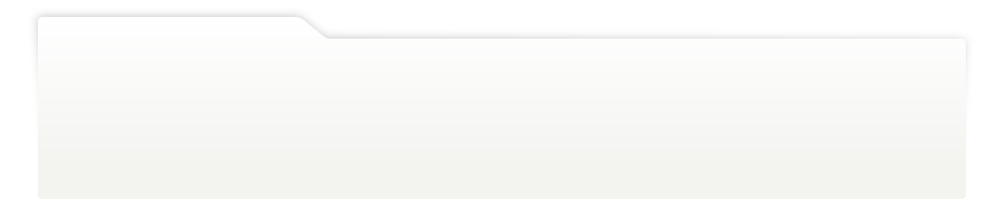
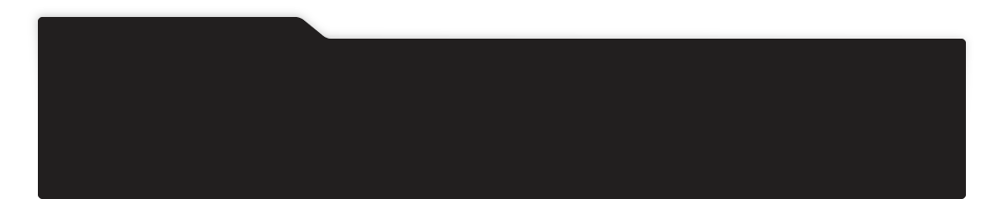
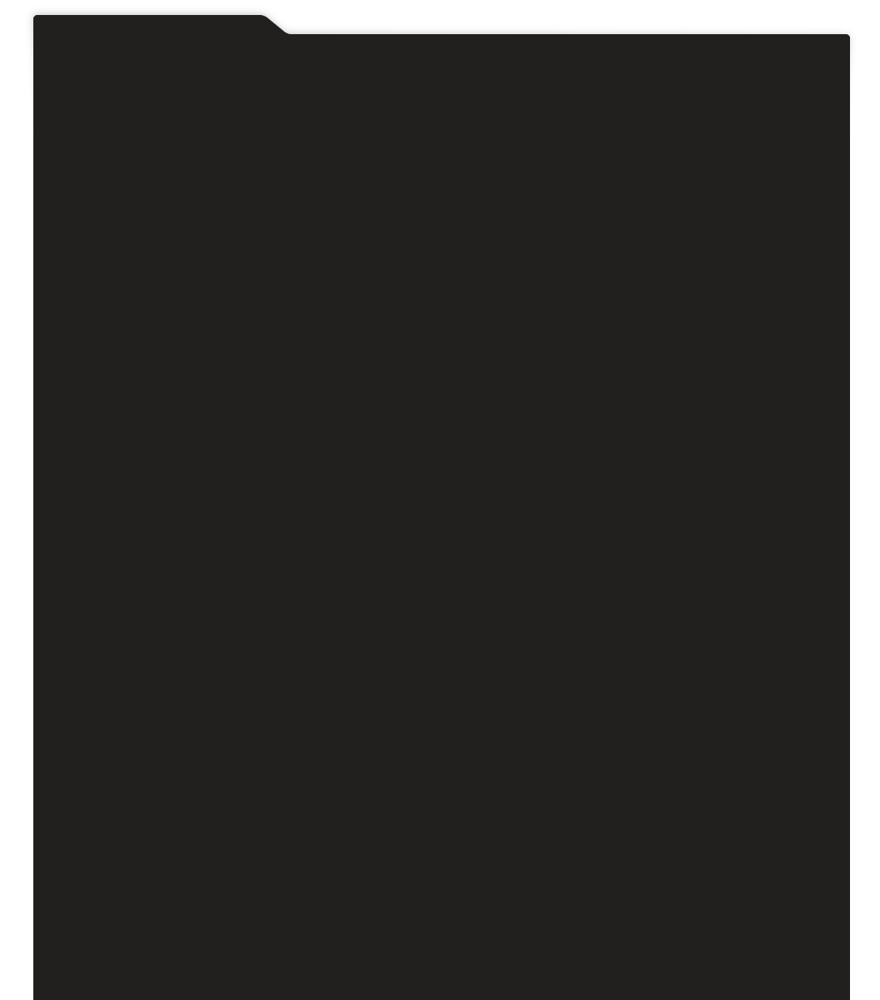
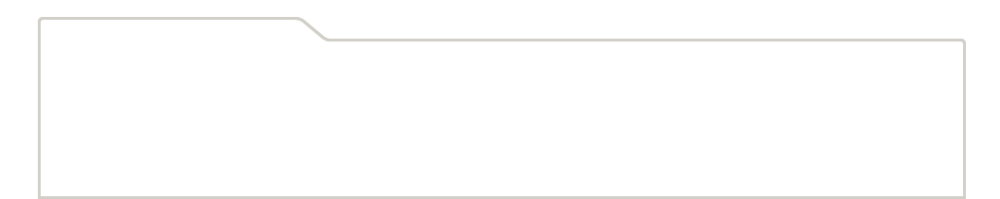
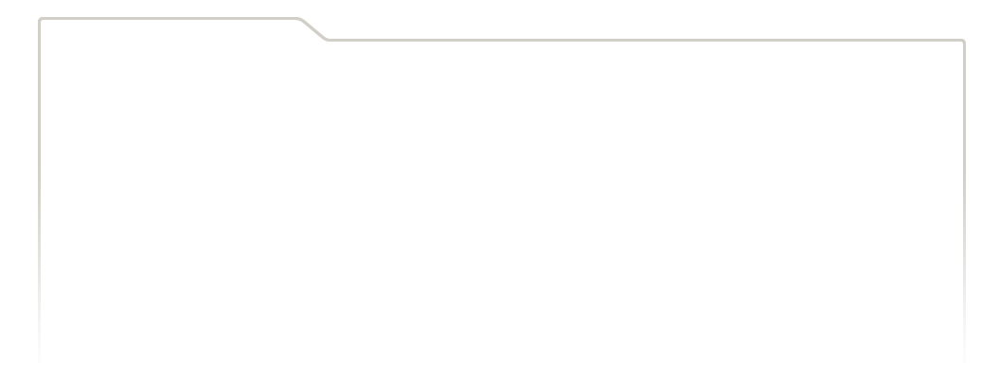
...
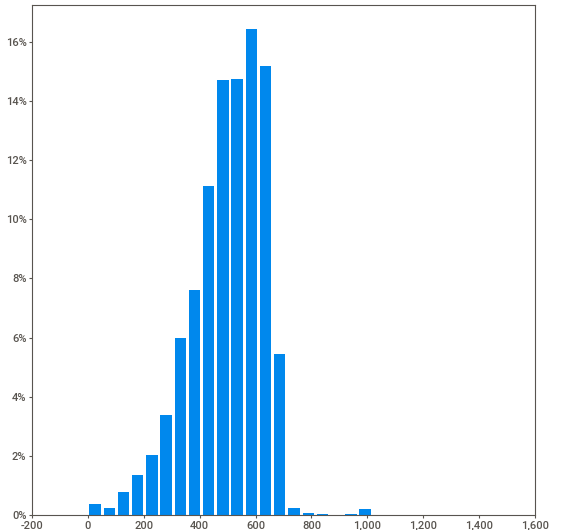
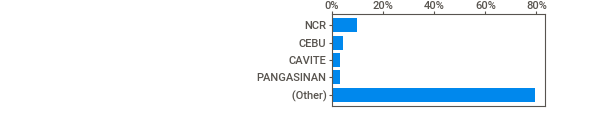
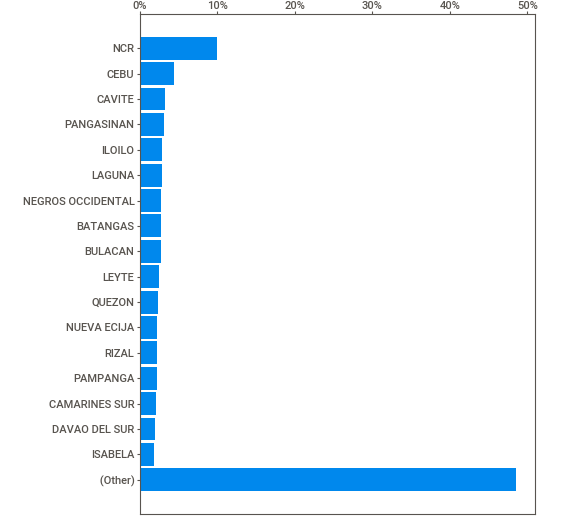
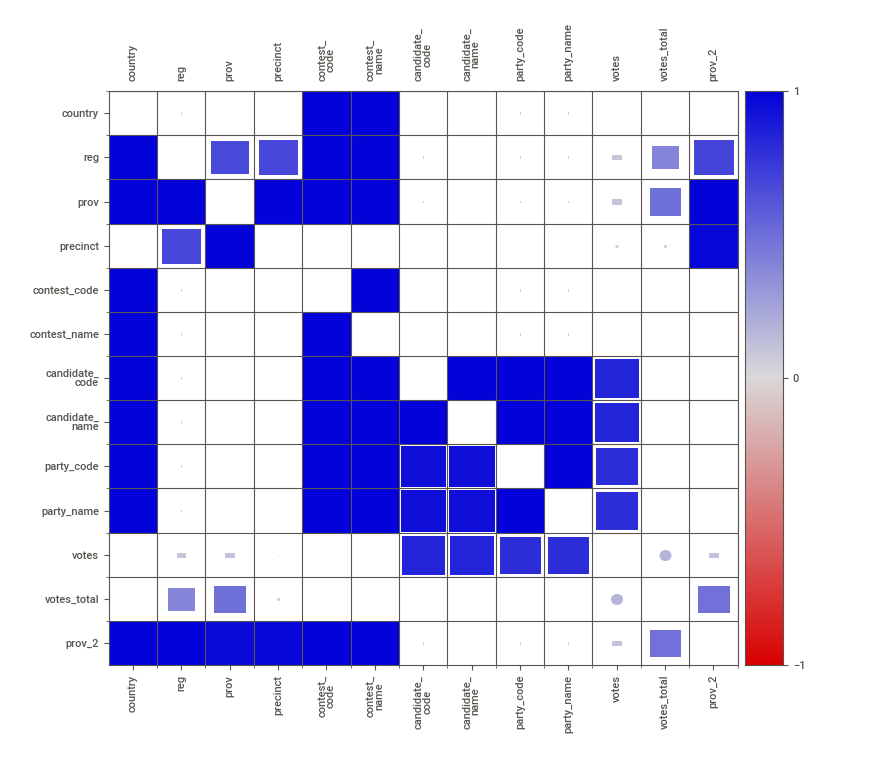
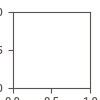

In [38]:
sweet_report = sv.analyze(df)
sweet_report.show_notebook(layout='vertical', scale=1)

                                             |                                             | [  0%]   00:00 ->…


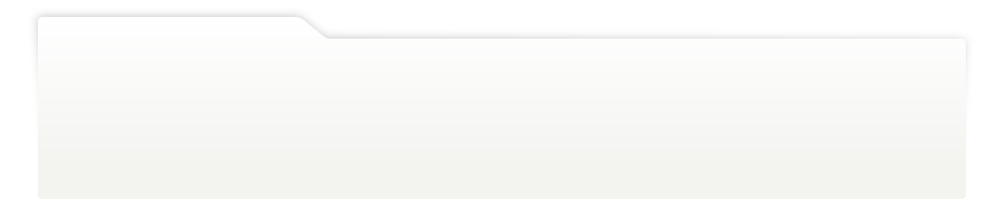
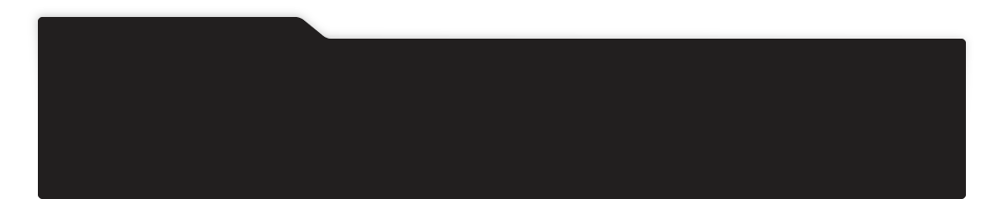
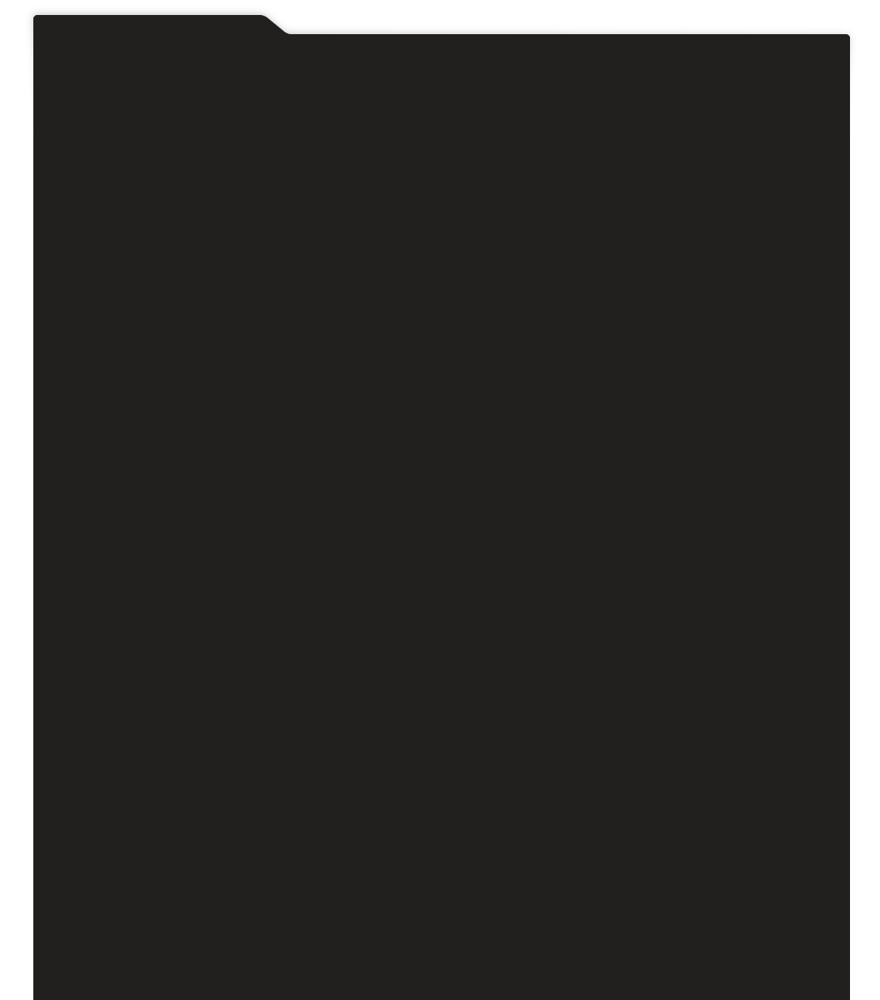
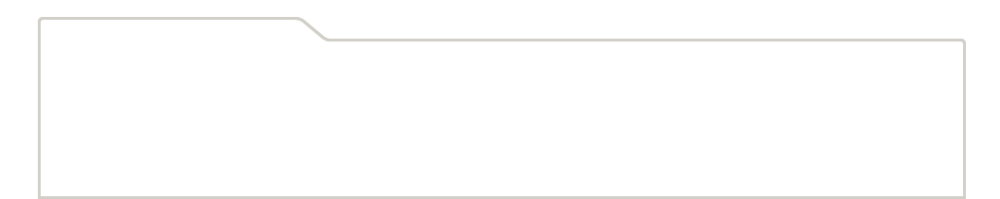
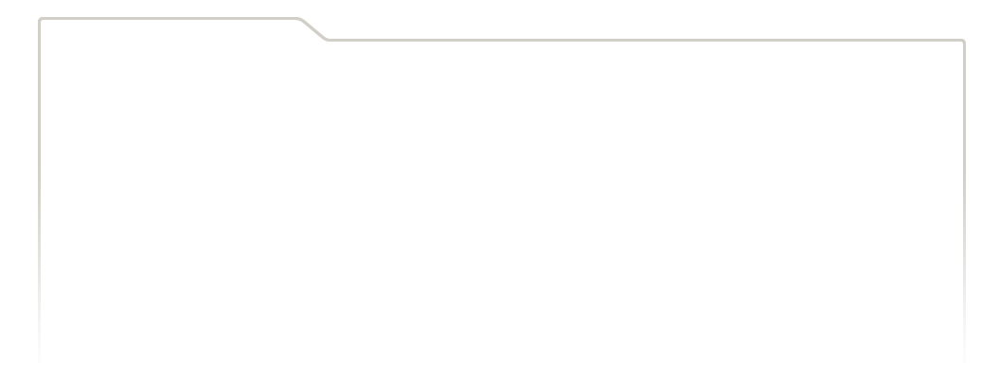
...
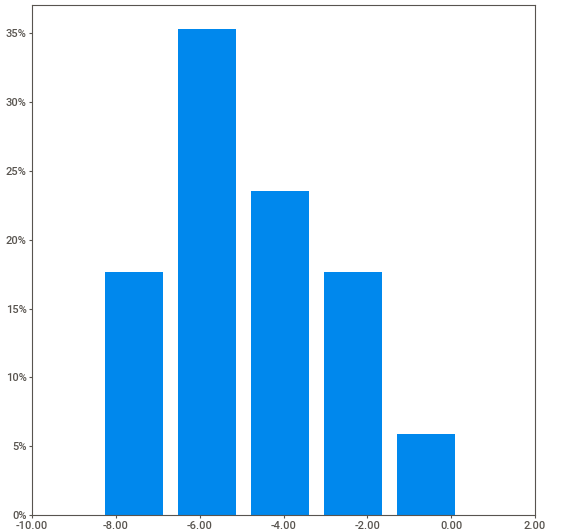
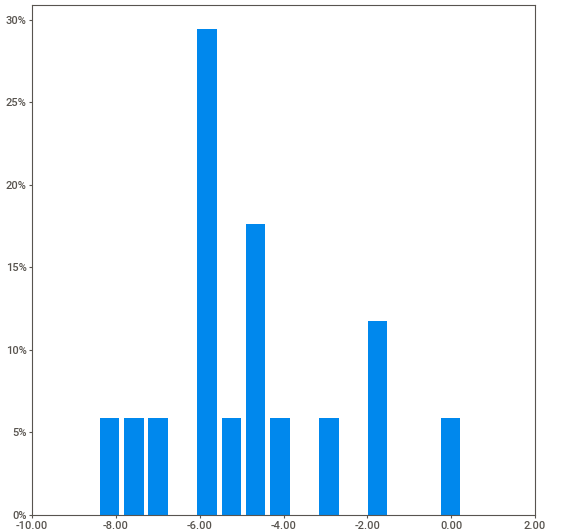
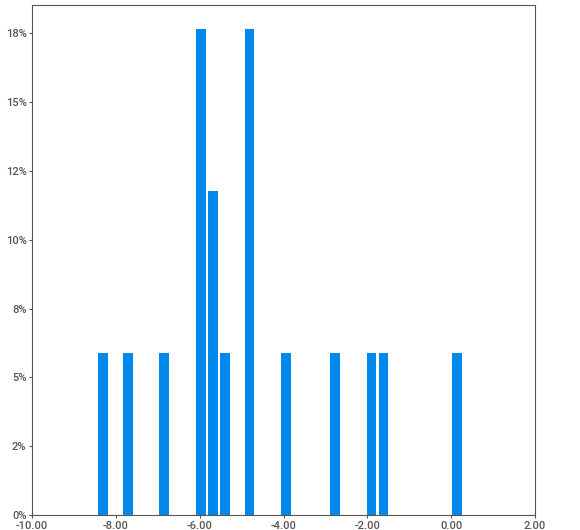
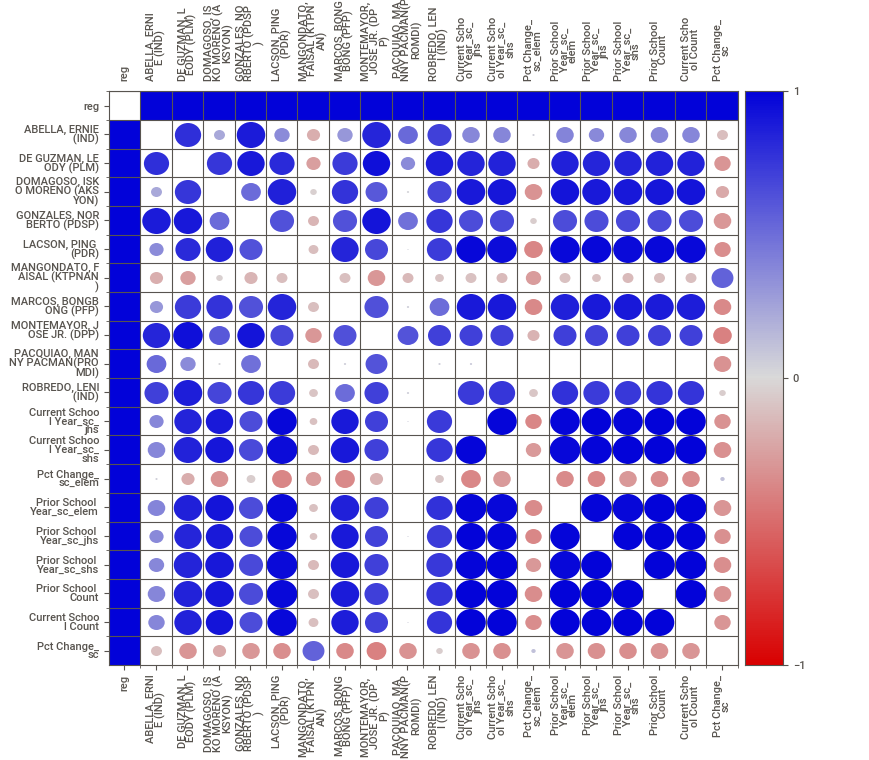
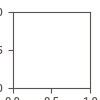

In [39]:
sweet_report = sv.analyze(df_reg_educ_tbl)
sweet_report.show_notebook(layout='vertical', scale=1)

                                             |                                             | [  0%]   00:00 ->…


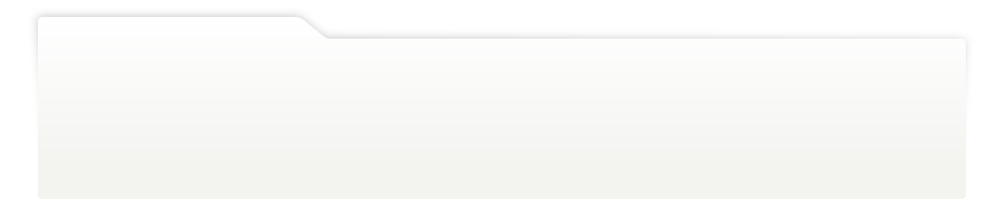
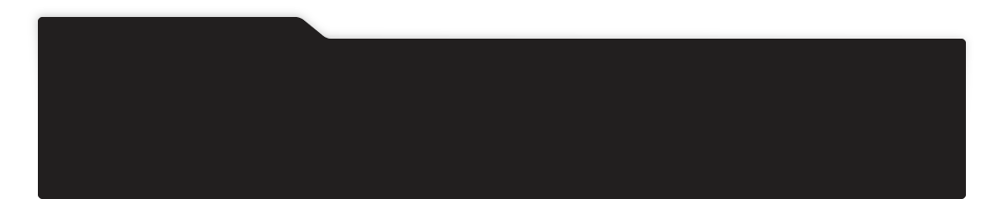
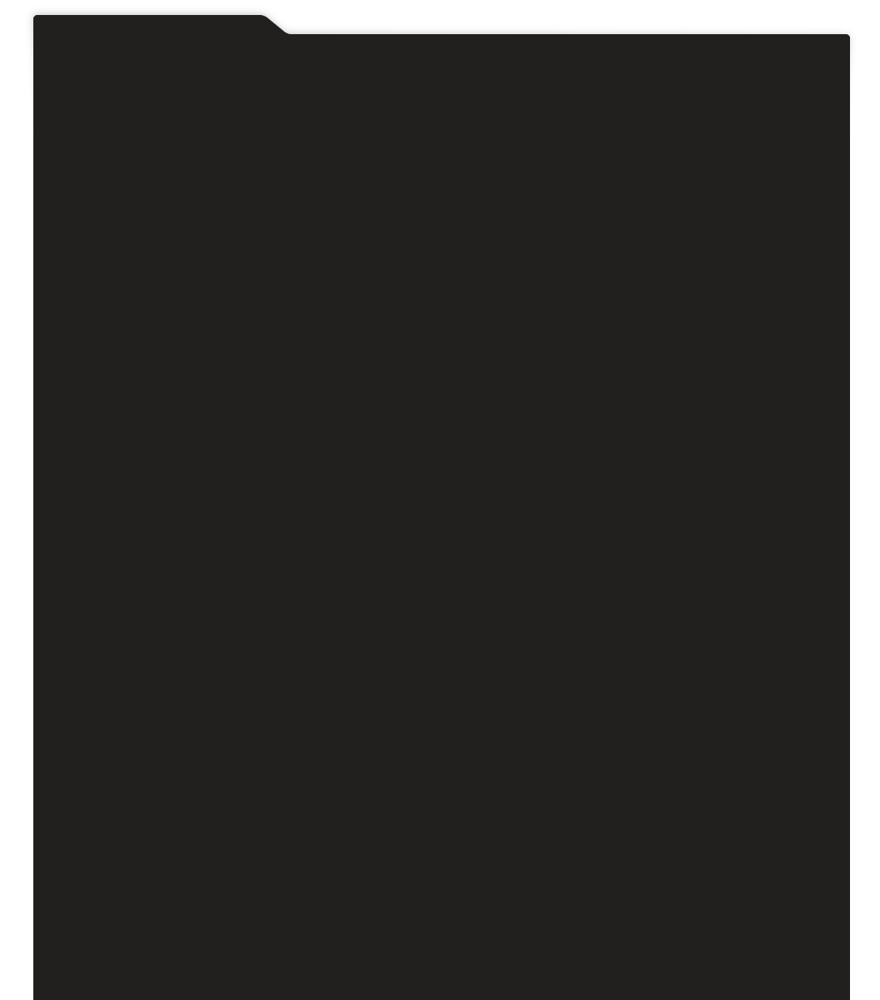
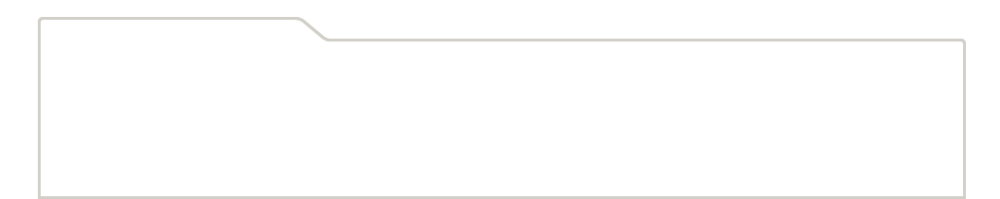
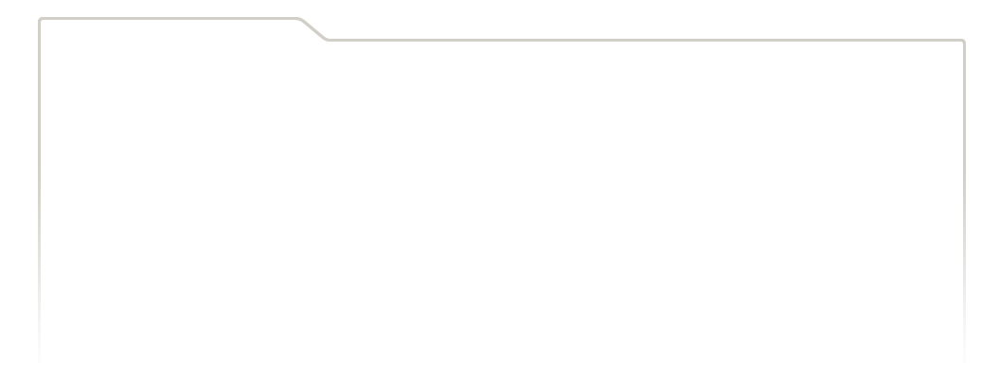
...
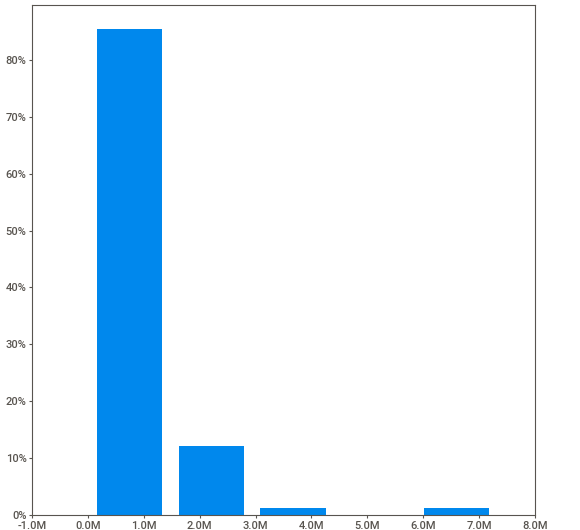
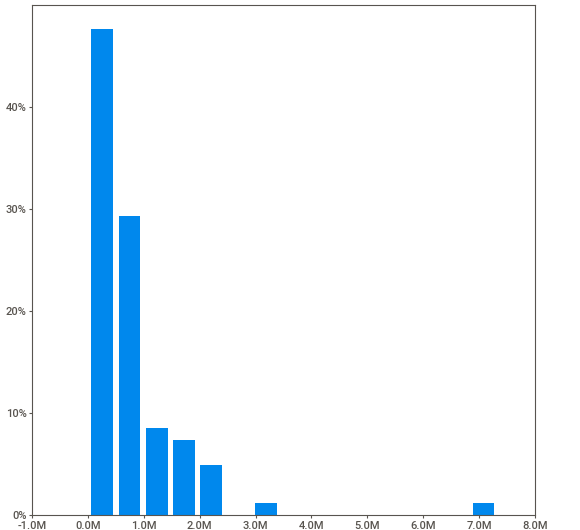
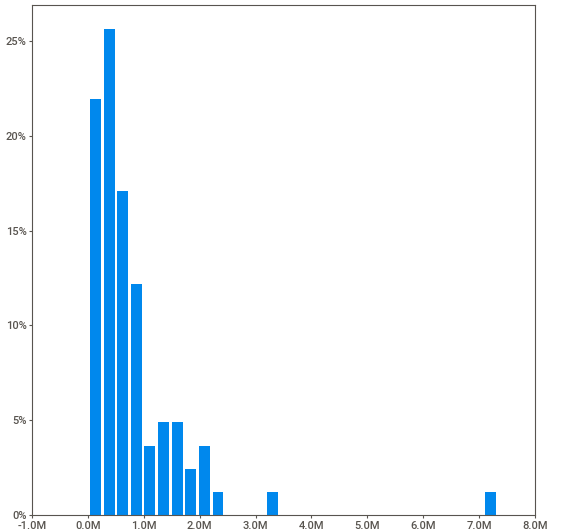
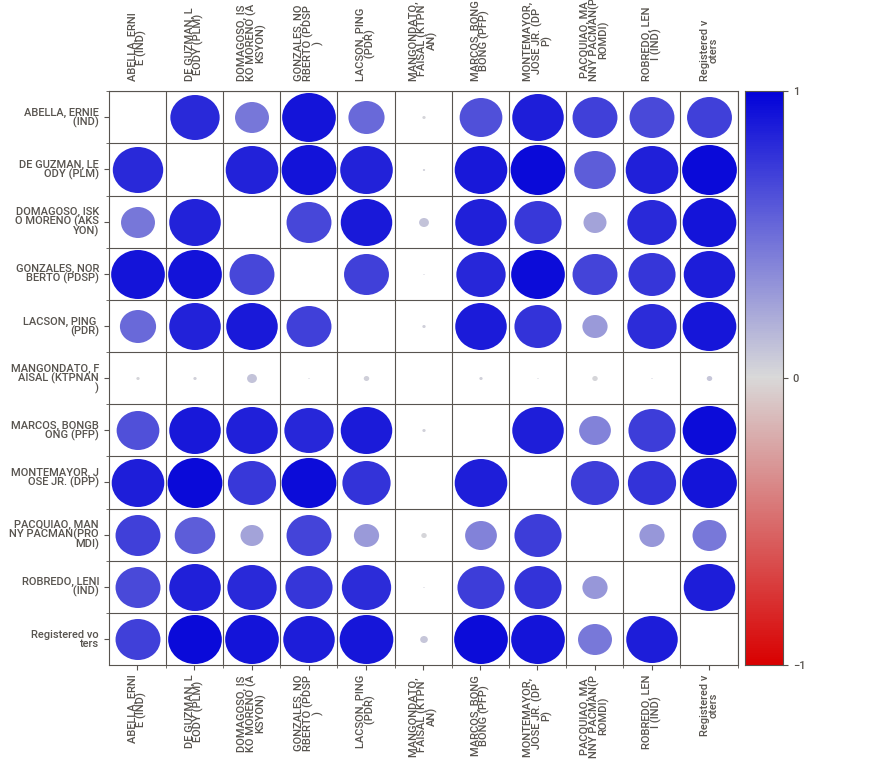
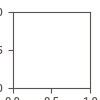

In [40]:
sweet_report = sv.analyze(df_prov_popn)
sweet_report.show_notebook(layout='vertical', scale=1)

### Correlations

**ALL CANDIDATES**

It's fascinating that none of the candidate pairings are negatively correlated near -1. This means that no relationship between candidates can be concluded when one's votes go up but the other goes down.

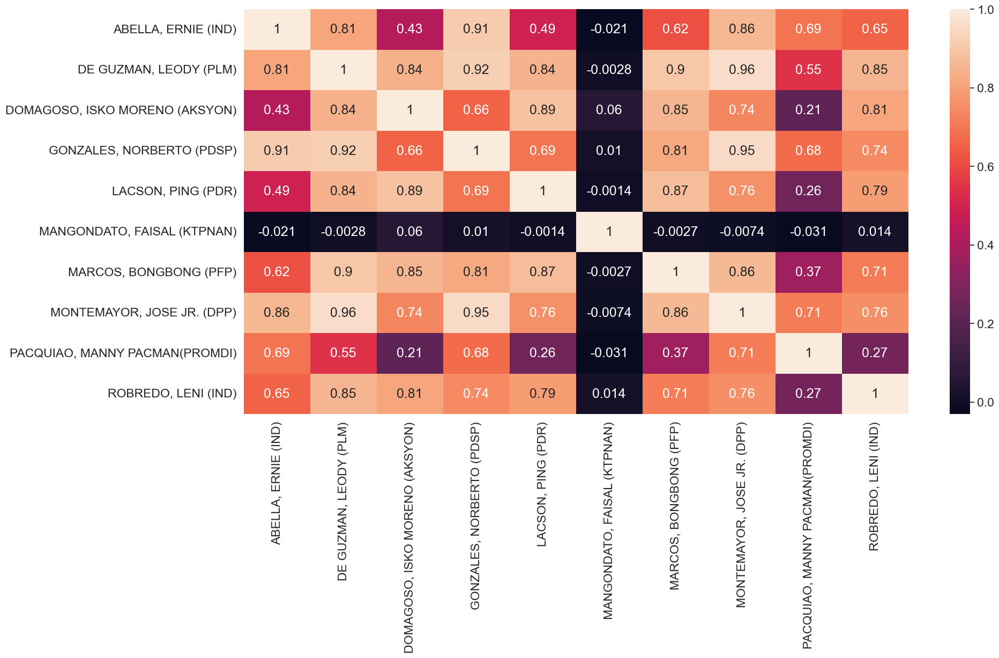

In [41]:
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False

plt.figure(figsize = (20,10))
sns.set(style='white', font_scale = 1.5)

sns.heatmap(df_prov_popn.iloc[:,:-1].corr(),
            alpha = 0.98,
            annot = True)
#plt.xticks(rotation=45)

plt.show()

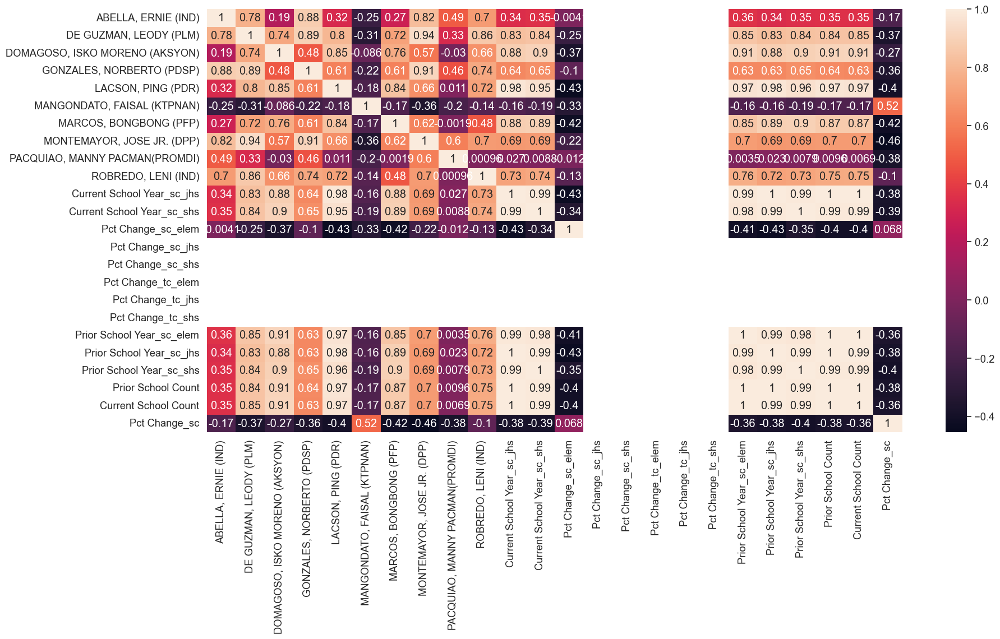

In [42]:
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False

plt.figure(figsize = (20,10))
sns.set(style='white', font_scale = 1.2)

sns.heatmap(df_reg_educ_tbl.iloc[:,1:].corr(),
            alpha = 0.98,
            annot = True)
#plt.xticks(rotation=45)

plt.show()



**TOP 5**

In [43]:
# create top candidates filter
df_top = df.groupby('candidate_name')['votes'].sum().sort_values(ascending=False)[:5]
df_top = df_top.reset_index()
df_top

,candidate_name,votes
0,"MARCOS, BONGBONG (PFP)",31084372
1,"ROBREDO, LENI (IND)",14805837
2,"PACQUIAO, MANNY PACMAN(PROMDI)",3628987
3,"DOMAGOSO, ISKO MORENO (AKSYON)",1898464
4,"LACSON, PING (PDR)",881776


In [44]:
df_top_list = list(df_top.iloc[:,0])
df_top_list

['MARCOS, BONGBONG (PFP)',
 'ROBREDO, LENI (IND)',
 'PACQUIAO, MANNY PACMAN(PROMDI)',
 'DOMAGOSO, ISKO MORENO (AKSYON)',
 'LACSON, PING (PDR)']

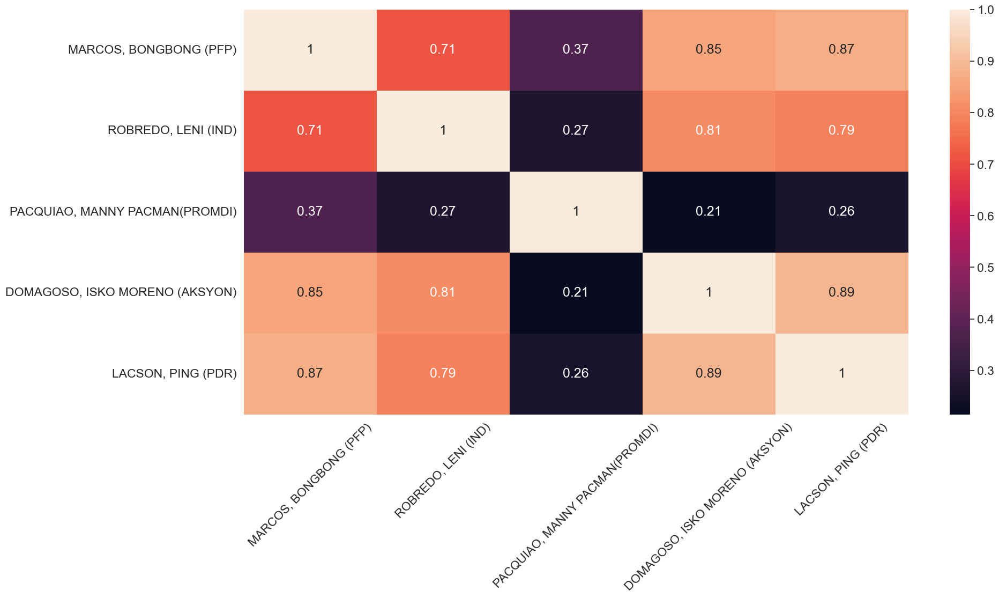

In [45]:
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False

plt.figure(figsize = (20,10))
sns.set(style='white', font_scale = 1.5)

sns.heatmap(df_prov_popn.loc[:,df_top_list].corr(),
            alpha = 0.98,
            annot = True)
plt.xticks(rotation=45)

plt.show()

In [46]:
pct_chg = list(df_reg_educ_tbl.columns[df_reg_educ_tbl.columns.str.contains('Pct Change')])
pct_chg

['Pct Change_sc_elem',
 'Pct Change_sc_jhs',
 'Pct Change_sc_shs',
 'Pct Change_tc_elem',
 'Pct Change_tc_jhs',
 'Pct Change_tc_shs',
 'Pct Change_sc']

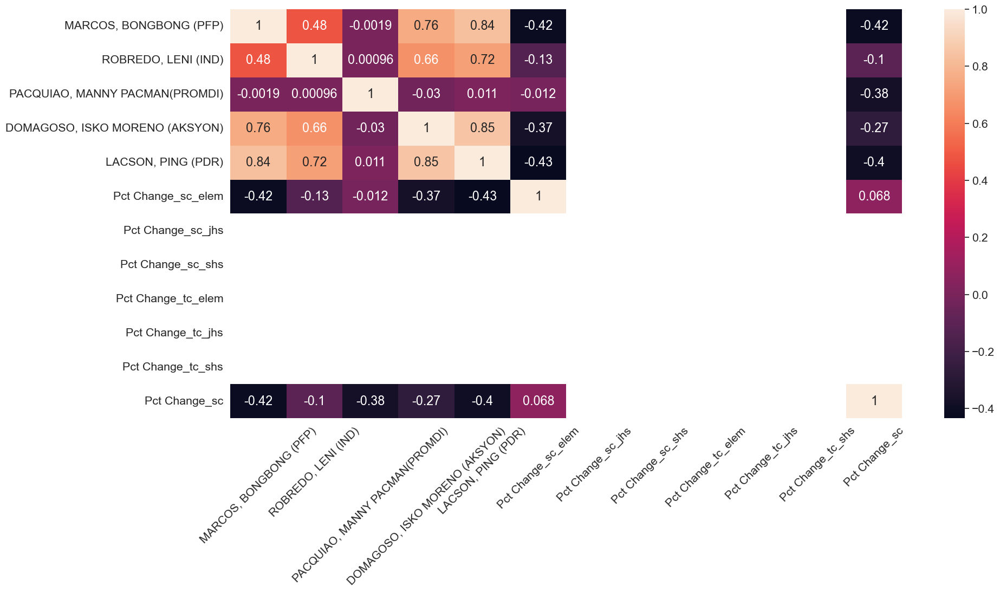

In [47]:
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False

plt.figure(figsize = (20,10))
sns.set(style='white', font_scale = 1.4)

sns.heatmap(df_reg_educ_tbl.loc[:,df_top_list+pct_chg].corr(),
            alpha = 0.98,
            annot = True)
plt.xticks(rotation=45)

plt.show()



### Crosstabs

In [48]:
pd.crosstab(index = df['prov'], 
            columns = df['candidate_name'], 
            values = df['votes'], 
            aggfunc = 'sum').fillna('')

candidate_name,"ABELLA, ERNIE (IND)","DE GUZMAN, LEODY (PLM)","DOMAGOSO, ISKO MORENO (AKSYON)","GONZALES, NORBERTO (PDSP)","LACSON, PING (PDR)","MANGONDATO, FAISAL (KTPNAN)","MARCOS, BONGBONG (PFP)","MONTEMAYOR, JOSE JR. (DPP)","PACQUIAO, MANNY PACMAN(PROMDI)","ROBREDO, LENI (IND)"
prov,,,,,,,,,,
ABRA,178,113,707,129,918,63,147655,96,588,4500
AGUSAN DEL NORTE,1083,604,7802,1020,2869,524,282746,508,38616,43031
AGUSAN DEL SUR,1598,518,2767,862,1553,213,152029,432,35882,144176
AKLAN,949,587,16764,548,4238,506,146323,574,20087,146284
ALBAY,2207,1743,6331,1736,4992,614,112651,845,8557,608779
AMERICAS,46,50,3486,33,906,10,28623,28,1052,21433
ANTIQUE,1147,846,22126,685,5312,303,115027,641,30190,142663
APAYAO,121,84,368,75,449,27,60181,124,906,1879
ASIA PACIFIC,131,99,6968,203,2353,19,159182,89,1700,35858


In [49]:
pd.crosstab(index = [df['reg'],df['prov']], 
            columns = df['candidate_name'], 
            values = df['votes'], 
            aggfunc = 'sum').fillna('')

candidate_name                                            ABELLA, ERNIE (IND)  \
reg                              prov                                           
BARMM                            BASILAN                                  571   
                                 LANAO DEL SUR                            663   
                                 MAGUINDANAO                             1516   
                                 SULU                                     142   
                                 TAWI-TAWI                                420   
CORDILLERA ADMINISTRATIVE REGION ABRA                                     178   
                                 APAYAO                                   121   
                                 BENGUET                                  292   
                                 IFUGAO                                   173   
                                 KALINGA                                  220   
                                 MOUNTAIN PROVINCE                        154   
NATIONAL CAPITAL REGION          NCR - FOURTH DISTRICT                   1053   
                                 NCR - MANILA                             410   
                                 NCR - SECOND DISTRICT                   1320   
                                 NCR - THIRD DISTRICT                     916   
                                 TAGUIG - PATEROS                         326   
OAV                              AMERICAS                                  46   
                                 ASIA PACIFIC                             131   
                                 EUROPE                                    28   
                                 MIDDLE EAST AND AFRICAS                   58   
REGION I                         ILOCOS NORTE                             280   
                                 ILOCOS SUR                               384   
                                 LA UNION                                 472   
                                 PANGASINAN                              3524   
REGION II                        BATANES                                   17   
                                 CAGAYAN                                 1163   
                                 ISABELA                                 1955   
                                 NUEVA VIZCAYA                            367   
                                 QUIRINO                                  169   
REGION III                       AURORA                                   243   
                                 BATAAN                                   671   
                                 BULACAN                                 2374   
                                 NUEVA ECIJA                             1956   
                                 PAMPANGA                                1853   
                                 TARLAC                                  1417   
                                 ZAMBALES                                 703   
REGION IV-A                      BATANGAS                                2187   
                                 CAVITE                                  1897   
                                 LAGUNA                                  2276   
                                 QUEZON                                  2345   
                                 RIZAL                                   1144   
REGION IV-B                      MARINDUQUE                               404   
                                 OCCIDENTAL MINDORO                       799   
                                 ORIENTAL MINDORO                         678   
                                 PALAWAN                                 2020   
                                 ROMBLON                                  374   
REGION IX                        ZAMBOANGA DEL NORTE                     1358   
                               

In [50]:
pd.crosstab(index = df['prov'], 
            columns = df['party_name'], 
            values = df['votes'], 
            aggfunc = 'sum').fillna('')

party_name,ABAG PROMDI,AKSYON DEMOKRATIKO,DEMOCRATIC PARTY OF THE PHILIPPINES,INDEPENDENT,KATIPUNAN NG KAMALAYANG KAYUMANGGI,PARTIDO DEMOKRATIKO SOSYALISTA NG PILIPINAS,PARTIDO FEDERAL NG PILIPINAS,PARTIDO LAKAS NG MASA,PARTIDO PARA SA DEMOKRATIKONG REPORMA
prov,,,,,,,,,
ABRA,588,707,96,4678,63,129,147655,113,918
AGUSAN DEL NORTE,38616,7802,508,44114,524,1020,282746,604,2869
AGUSAN DEL SUR,35882,2767,432,145774,213,862,152029,518,1553
AKLAN,20087,16764,574,147233,506,548,146323,587,4238
ALBAY,8557,6331,845,610986,614,1736,112651,1743,4992
AMERICAS,1052,3486,28,21479,10,33,28623,50,906
ANTIQUE,30190,22126,641,143810,303,685,115027,846,5312
APAYAO,906,368,124,2000,27,75,60181,84,449
ASIA PACIFIC,1700,6968,89,35989,19,203,159182,99,2353


### Bar Plots

Text(0, 0.5, 'Presidential Candidates')

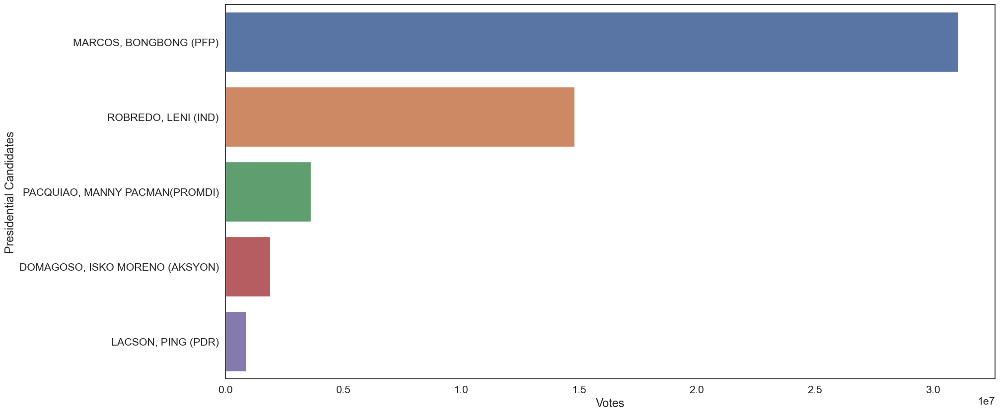

In [51]:
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False

plt.figure(figsize = (20,10))
sns.set(style='white', font_scale = 1.4)

sns.barplot(x = 'votes',
           y = 'candidate_name',
           data = df_top)

plt.xlabel('Votes')
plt.ylabel('Presidential Candidates')

In [52]:
# create top provinces filter
df_prov_popn_top = df_prov_popn.groupby('prov_2')['Registered voters'].sum().sort_values(ascending=False)[:5]
df_prov_popn_top = df_prov_popn_top.reset_index()
df_prov_popn_top

,prov_2,Registered voters
0,NCR,"7,322,361.00"
1,CEBU,"3,288,778.00"
2,CAVITE,"2,302,353.00"
3,PANGASINAN,"2,096,936.00"
4,LAGUNA,"2,045,687.00"


In [53]:
df_prov_popn_top_list = list(df_prov_popn_top.iloc[:,0])
df_prov_popn_top_list

['NCR', 'CEBU', 'CAVITE', 'PANGASINAN', 'LAGUNA']

Text(0.5, 0, '')

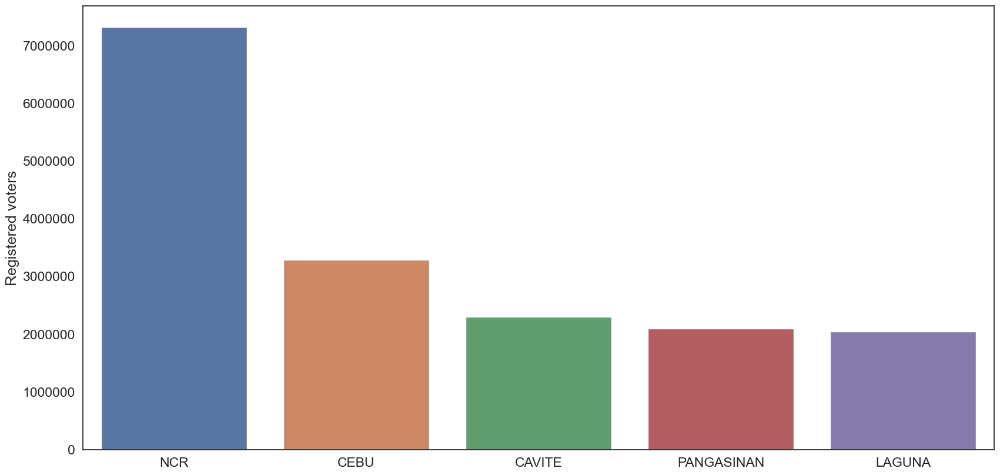

In [54]:
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False

plt.figure(figsize = (20,10))
sns.set(style='white', font_scale = 1.5)

sns.barplot(x = 'prov_2',
            y = 'Registered voters',
            data = df_prov_popn[df_prov_popn['prov_2'].isin(df_prov_popn_top_list)],
            order = df_prov_popn[df_prov_popn['prov_2'].isin(df_prov_popn_top_list)].sort_values('Registered voters', ascending = False).prov_2)

plt.xlabel('')

In [55]:
candidates = ['ABELLA, ERNIE (IND)', 'DE GUZMAN, LEODY (PLM)',
       'DOMAGOSO, ISKO MORENO (AKSYON)', 'GONZALES, NORBERTO (PDSP)',
       'LACSON, PING (PDR)', 'MANGONDATO, FAISAL (KTPNAN)',
       'MARCOS, BONGBONG (PFP)', 'MONTEMAYOR, JOSE JR. (DPP)',
       'PACQUIAO, MANNY PACMAN(PROMDI)', 'ROBREDO, LENI (IND)']

df_reg_educ_tbl['votes'] = df_reg_educ_tbl.loc[:,candidates].sum(axis=1)

In [56]:
# create top region filter
df_reg_educ_tbl_top = df_reg_educ_tbl.groupby('reg')['votes'].sum().sort_values(ascending=False)[:5]
df_reg_educ_tbl_top = df_reg_educ_tbl_top.reset_index()
df_reg_educ_tbl_top

,reg,votes
0,REGION IV-A,7450564
1,REGION III,6075581
2,NATIONAL CAPITAL REGION,5850415
3,REGION VII,4204097
4,REGION VI,4041148


In [57]:
df_reg_educ_tbl_top_list = list(df_reg_educ_tbl_top.iloc[:,0])
df_reg_educ_tbl_top_list

['REGION IV-A',
 'REGION III',
 'NATIONAL CAPITAL REGION',
 'REGION VII',
 'REGION VI']

Text(0.5, 0, '')

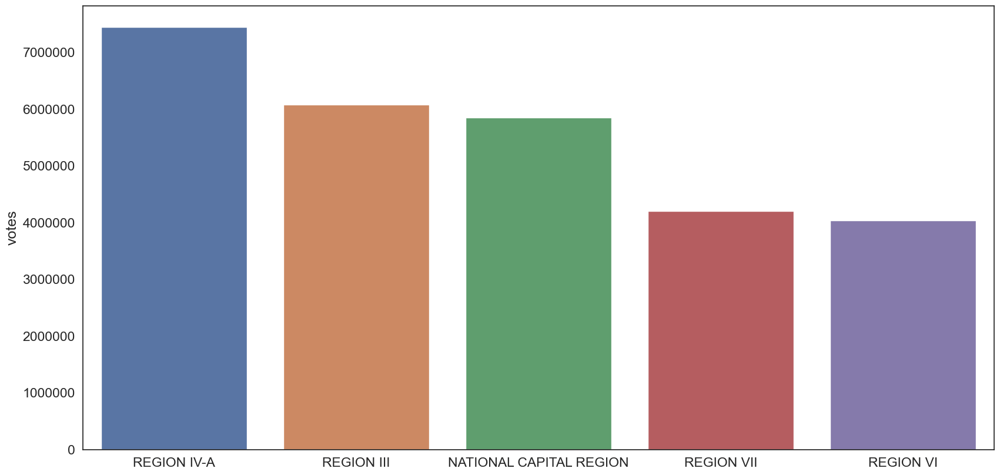

In [58]:
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False

plt.figure(figsize = (20,10))
sns.set(style='white', font_scale = 1.5)

sns.barplot(x = 'reg_2',
           y = 'votes',
           data = df_reg_educ_tbl[df_reg_educ_tbl['reg_2'].isin(df_reg_educ_tbl_top_list)],
           order = df_reg_educ_tbl[df_reg_educ_tbl['reg_2'].isin(df_reg_educ_tbl_top_list)].sort_values('votes', ascending = False).reg_2)

plt.xlabel('')


In [59]:
school_count_combi.columns

Index(['Current School Year_sc_elem', 'Current School Year_sc_jhs',
       'Current School Year_sc_shs', 'Pct Change_sc_elem', 'Pct Change_sc_jhs',
       'Pct Change_sc_shs', 'Pct Change_tc_elem', 'Pct Change_tc_jhs',
       'Pct Change_tc_shs', 'Prior School Year_sc_elem',
       'Prior School Year_sc_jhs', 'Prior School Year_sc_shs', 'Region',
       'Prior School Count', 'Current School Count', 'Pct Change_sc'],
      dtype='object')

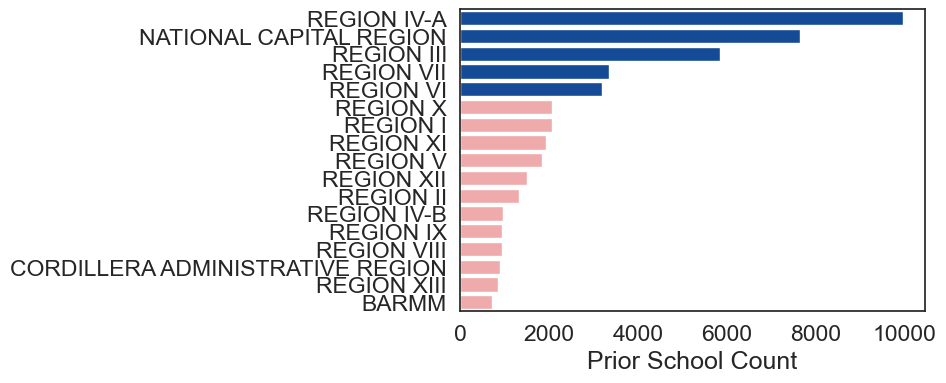

In [60]:
rcParams['axes.prop_cycle'] = cycler(color=['#0047AB','#0047AB','#0047AB','#0047AB','#0047AB','#FAA0A0','#FAA0A0','#FAA0A0','#FAA0A0','#FAA0A0','#FAA0A0','#FAA0A0','#FAA0A0','#FAA0A0','#FAA0A0','#FAA0A0','#FAA0A0'])

sns.barplot(x = 'Prior School Count',
            y = 'Region', 
            data = school_count_combi,
            order = school_count_combi.sort_values('Prior School Count', ascending = False).Region)

plt.ylabel('')
plt.show()

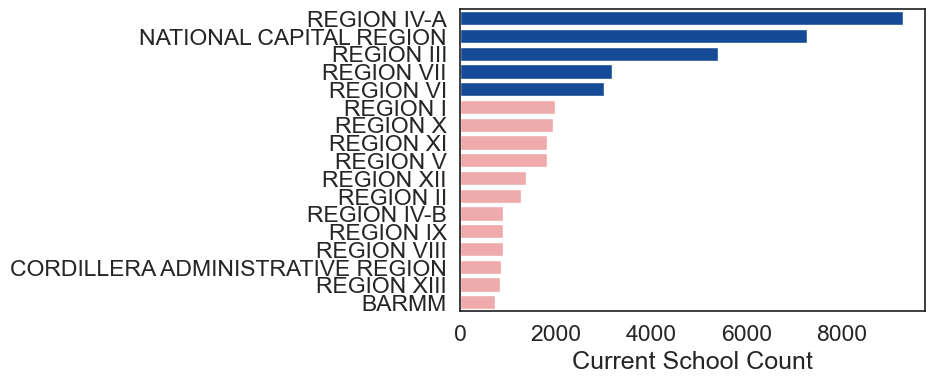

In [61]:
rcParams['axes.prop_cycle'] = cycler(color=['#0047AB','#0047AB','#0047AB','#0047AB','#0047AB','#FAA0A0','#FAA0A0','#FAA0A0','#FAA0A0','#FAA0A0','#FAA0A0','#FAA0A0','#FAA0A0','#FAA0A0','#FAA0A0','#FAA0A0','#FAA0A0'])

sns.barplot(x = 'Current School Count',
            y = 'Region',
            data = school_count_combi,
            order = school_count_combi.sort_values('Current School Count', ascending = False).Region)

plt.ylabel('')
plt.show()

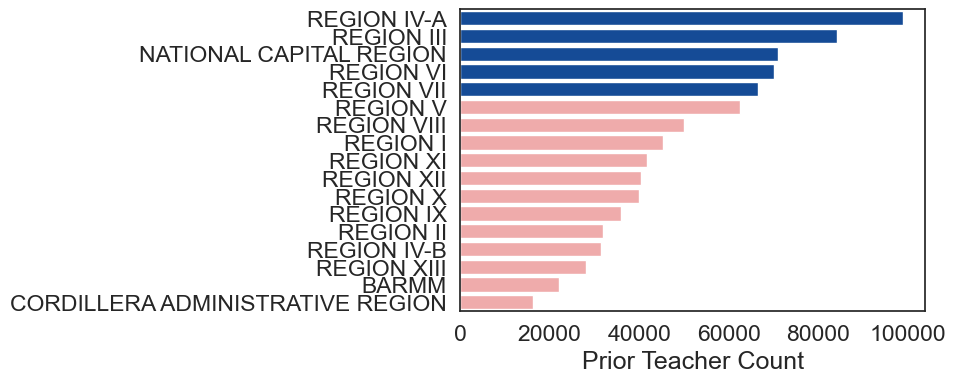

In [62]:
sns.barplot(x = 'Prior Teacher Count',
            y = 'Region',
            data = teacher_count_pub,
            order = teacher_count_pub.sort_values('Prior Teacher Count', ascending = False).Region)

plt.ylabel('')
plt.show()

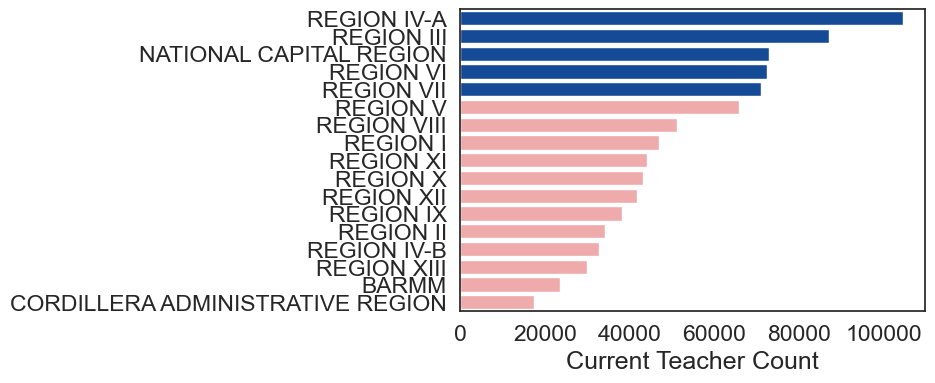

In [63]:
sns.barplot(x = 'Current Teacher Count',
            y = 'Region',
            data = teacher_count_pub,
            order = teacher_count_pub.sort_values('Current Teacher Count', ascending = False).Region)

plt.ylabel('')
plt.show()

### Tree Plot

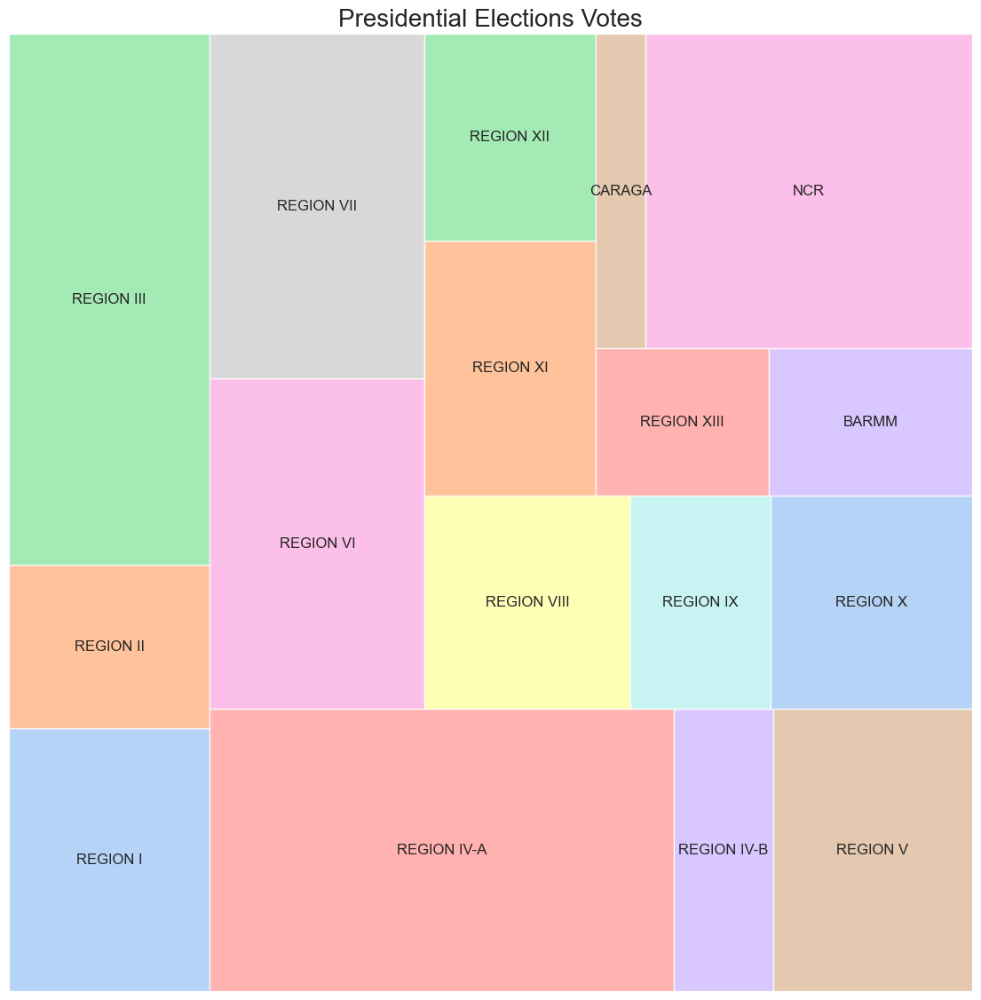

In [64]:
# labels = df_top['candidate_name'].astype('str') #+ ' (' + df_summary['Percentage'].astype('str') + '%)'

mpl.rcParams.update(mpl.rcParamsDefault)

fig = plt.figure(figsize = (14,14))
sns.set(style='white', font_scale = 1)
squarify.plot(sizes = df_reg_educ_tbl.groupby('reg')['votes'].sum('votes').reset_index()['votes'], 
              label = label_reg, 
              alpha = 0.8,
              color = sns.color_palette("pastel",len(df_reg_educ_tbl.groupby('reg')['votes'].sum('votes').reset_index())),
              pad = 0,
              text_kwargs = dict(fontsize=12,wrap=True))

plt.axis('off')
plt.title('Presidential Elections Votes', fontsize=20)
plt.show()

In [65]:
df_prov_popn.columns

Index(['prov_2', 'ABELLA, ERNIE (IND)', 'DE GUZMAN, LEODY (PLM)',
       'DOMAGOSO, ISKO MORENO (AKSYON)', 'GONZALES, NORBERTO (PDSP)',
       'LACSON, PING (PDR)', 'MANGONDATO, FAISAL (KTPNAN)',
       'MARCOS, BONGBONG (PFP)', 'MONTEMAYOR, JOSE JR. (DPP)',
       'PACQUIAO, MANNY PACMAN(PROMDI)', 'ROBREDO, LENI (IND)', 'Province',
       'Registered voters'],
      dtype='object')

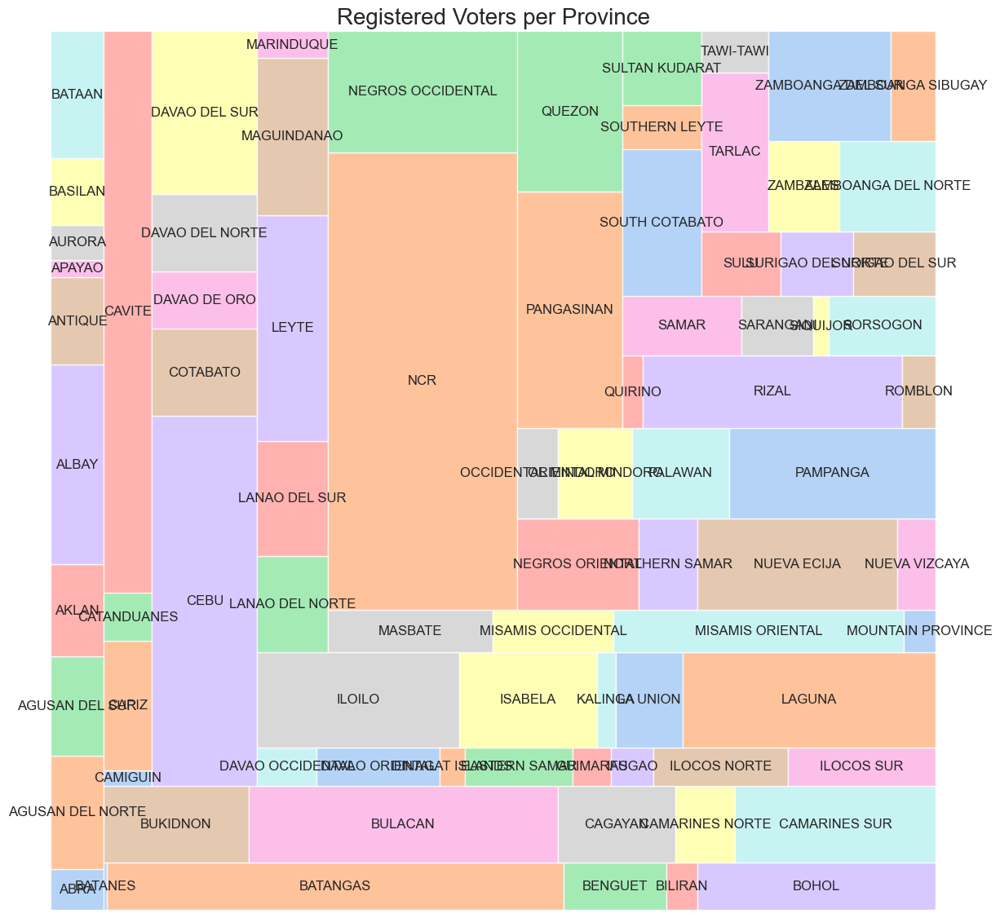

In [66]:
df_prov_popn_summ = df_prov_popn.groupby('prov_2')['Registered voters'].sum('Registered voters').reset_index()
df_prov_popn_summ = df_prov_popn_summ[df_prov_popn_summ['Registered voters'] > 0]

# labels = df_top['candidate_name'].astype('str') #+ ' (' + df_summary['Percentage'].astype('str') + '%)'

fig = plt.figure(figsize = (14,14))
sns.set(style='white', font_scale = 1)
squarify.plot(sizes = df_prov_popn_summ['Registered voters'], 
              label = df_prov_popn_summ['prov_2'], 
              alpha = 0.8,
              color = sns.color_palette("pastel",len(df_prov_popn_summ)),
#              pad = 1,
              text_kwargs = dict(fontsize=12,wrap=True))

plt.axis('off')
plt.title('Registered Voters per Province', fontsize=20)
plt.show()

In [67]:
# labels = df_top['candidate_name'].astype('str') + ' (' + df_summary['Percentage'].astype('str') + '%)'

# fig = plt.figure(figsize = (14,14))
# sns.set(style='white', font_scale = 1)
# squarify.plot(sizes = df_top['votes'], 
#               label = labels, 
#               alpha = 0.8,
#               color = sns.color_palette("Spectral",len(df_summary)),
#               pad = 1,
#               text_kwargs = dict(fontsize=12,wrap=True))

# plt.axis('off')
# plt.title('Presidential Elections Votes', fontsize=20)
# plt.show()

### Line / Factor Plots

**Election-related**

<Figure size 1400x1400 with 0 Axes>

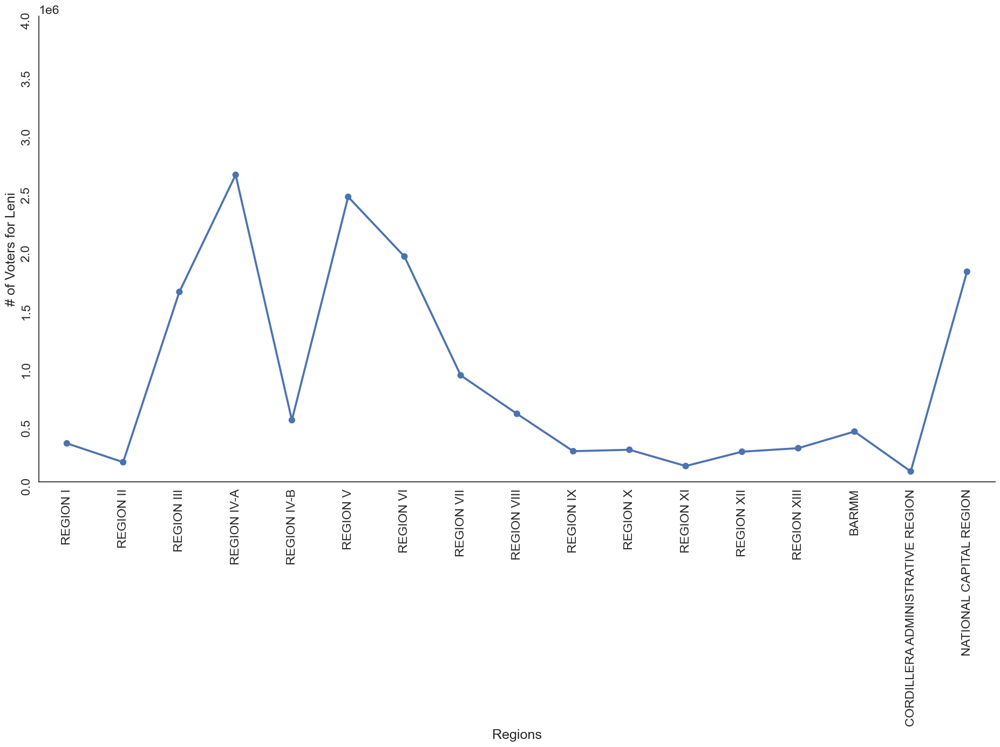

In [68]:
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False


fig = plt.figure(figsize = (14,14))
sns.set(style='white', font_scale = 1.51)

df_reg_educ_tbl_factor = df_reg_educ_tbl.groupby(['reg'])['ROBREDO, LENI (IND)'].sum('ROBREDO, LENI (IND)').reset_index()
sns.factorplot(data=df_reg_educ_tbl_factor, 
               x = 'reg', 
               y = 'ROBREDO, LENI (IND)',
               size = 10,
               aspect = 2)

plt.ylim(0,4*10**6)
plt.xticks(rotation=90)
plt.yticks(rotation=90)
plt.xlabel('Regions')
plt.ylabel('# of Voters for Leni')
plt.show()

<Figure size 1400x1400 with 0 Axes>

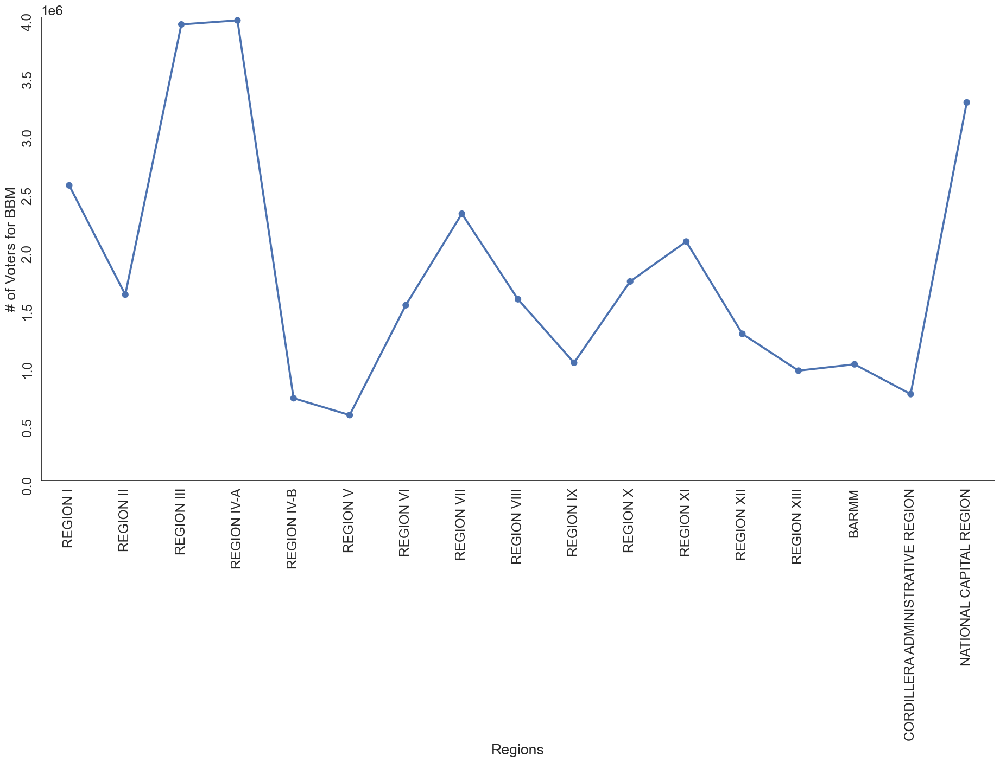

In [69]:
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False


fig = plt.figure(figsize = (14,14))
sns.set(style='white', font_scale = 1.6)

df_reg_educ_tbl_factor = df_reg_educ_tbl.groupby(['reg'])['MARCOS, BONGBONG (PFP)'].sum('MARCOS, BONGBONG (PFP)').reset_index()
sns.factorplot(data=df_reg_educ_tbl_factor, 
               x = 'reg', 
               y = 'MARCOS, BONGBONG (PFP)',
               size = 10,
               aspect = 2)

plt.ylim(0,4*10**6)
plt.xticks(rotation=90)
plt.yticks(rotation=90)
plt.xlabel('Regions')
plt.ylabel('# of Voters for BBM')
plt.show()

**Education-related**

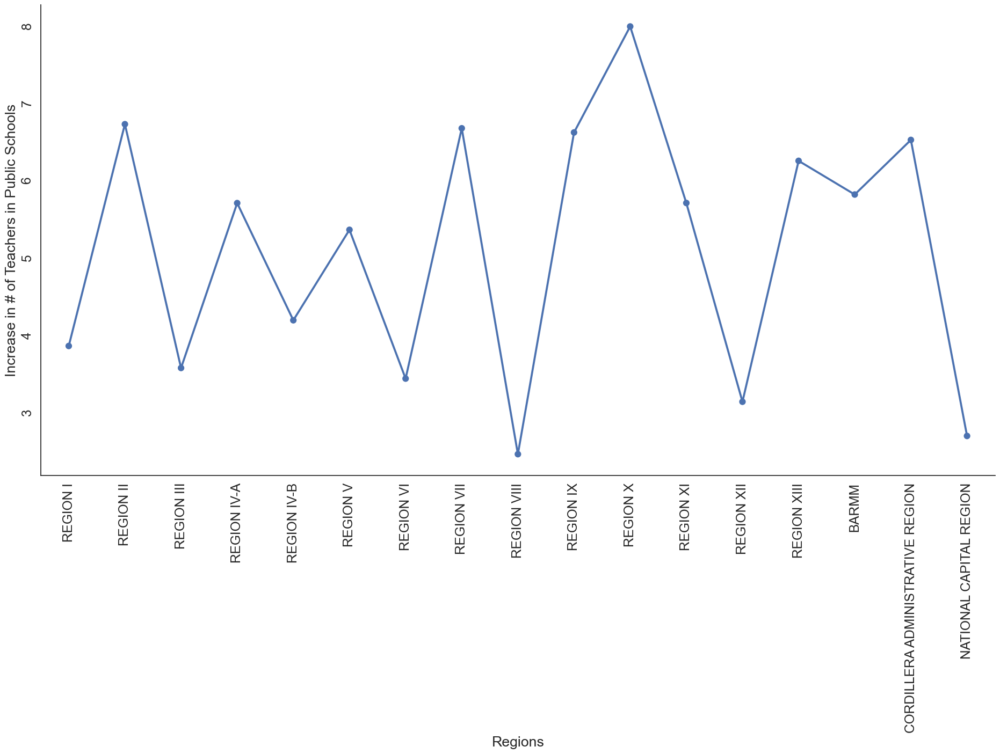

In [70]:
sns.set(style='white', font_scale = 1.6)

g = sns.factorplot(data = teacher_count_pub,
                   x = 'Region',
                   y = 'Pct Change_tc',
                   size = 10,
                   aspect = 2)

plt.xlabel('Regions')
plt.ylabel('Increase in # of Teachers in Public Schools')
plt.xticks(rotation=90)
plt.yticks(rotation=90)
plt.show()

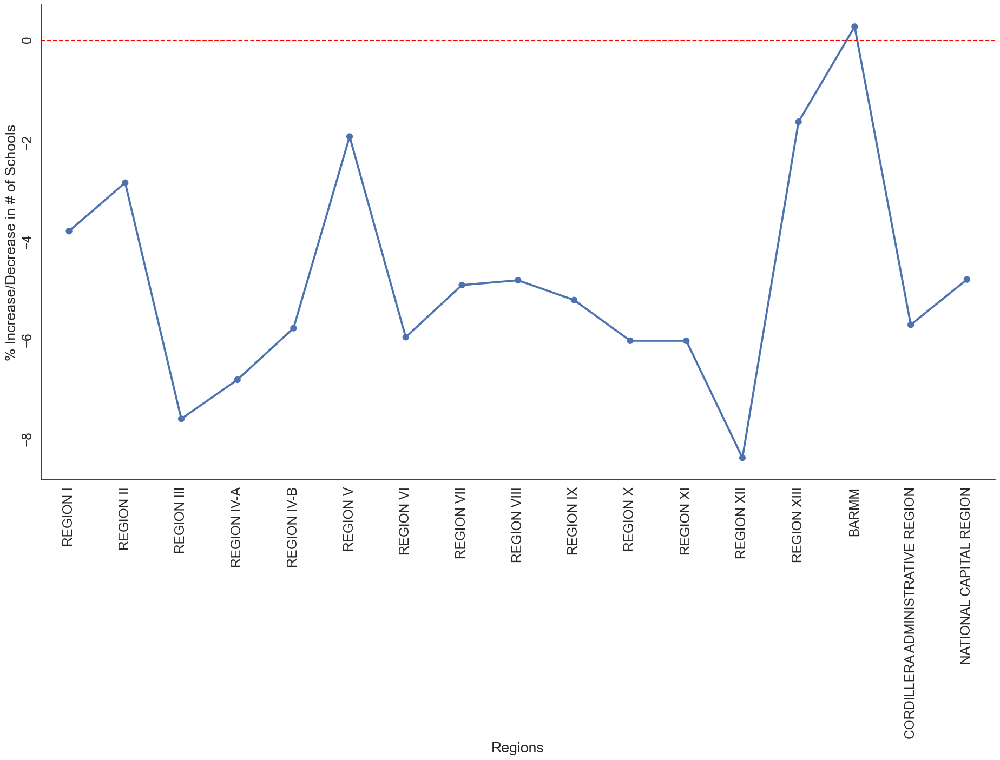

In [71]:
sns.set(style='white', font_scale = 1.6)

sns.factorplot(data=school_count_combi,
                   x = 'Region',
                   y = 'Pct Change_sc',
                   size = 10,
                   aspect = 2)

plt.axhline(y = 0,
           linestyle = '--',
           color = 'red')
plt.xlabel('Regions')
plt.ylabel('% Increase/Decrease in # of Schools')
plt.xticks(rotation=90)
plt.yticks(rotation=90)
plt.show()

<Figure size 1400x1400 with 0 Axes>

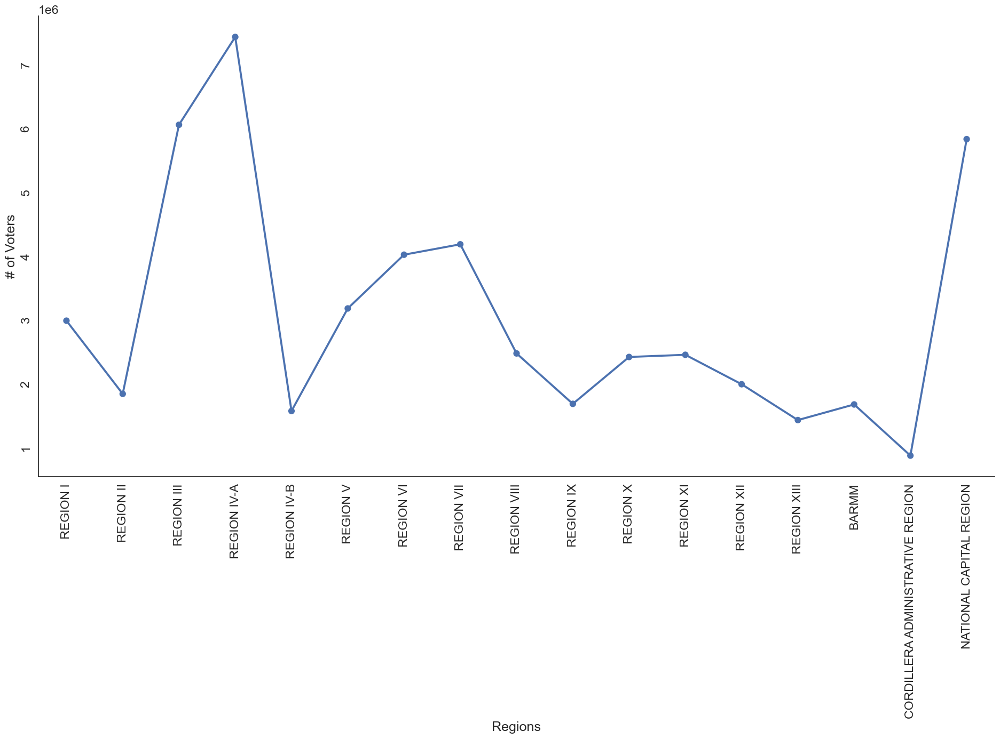

In [72]:
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False


fig = plt.figure(figsize = (14,14))
sns.set(style='white', font_scale = 1.51)

df_reg_educ_tbl_factor = df_reg_educ_tbl.groupby(['reg'])['votes'].sum('votes').reset_index()
g = sns.factorplot(data=df_reg_educ_tbl_factor, 
               x = 'reg', 
               y = 'votes',
               size = 10,
               aspect = 2)

plt.xticks(rotation=90)
plt.yticks(rotation=90)
plt.xlabel('Regions')
plt.ylabel('# of Voters')
plt.show()

In [73]:
pearsonr(df_reg_educ_tbl['Current School Count'],df_reg_educ_tbl['MARCOS, BONGBONG (PFP)'])

(0.8706990556679857, 5.444983480708017e-06)

In [74]:
pearsonr(df_reg_educ_tbl['Current School Count'],df_reg_educ_tbl['ROBREDO, LENI (IND)'])

(0.7516027773281997, 0.0005035370483376061)

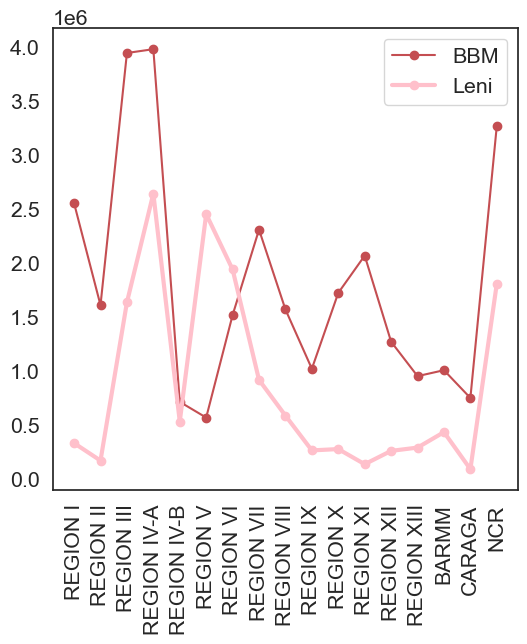

In [75]:
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False

fig = plt.figure(figsize = (6,6))
sns.set(style = 'white', font_scale = 1.4)

line1 = plt.plot(label_reg, 
                 df_reg_educ_tbl['MARCOS, BONGBONG (PFP)'],
                 'ro-',
                 label = 'BBM')

line2 = plt.plot(label_reg, 
                 df_reg_educ_tbl['ROBREDO, LENI (IND)'],
                 color = 'pink', 
                 marker = 'o', 
                 linestyle = 'solid',
                 linewidth = 3,
                 label = 'Leni')

plt.xticks(label_reg, 
           rotation = 'vertical')
plt.legend()
plt.show()

### MISC

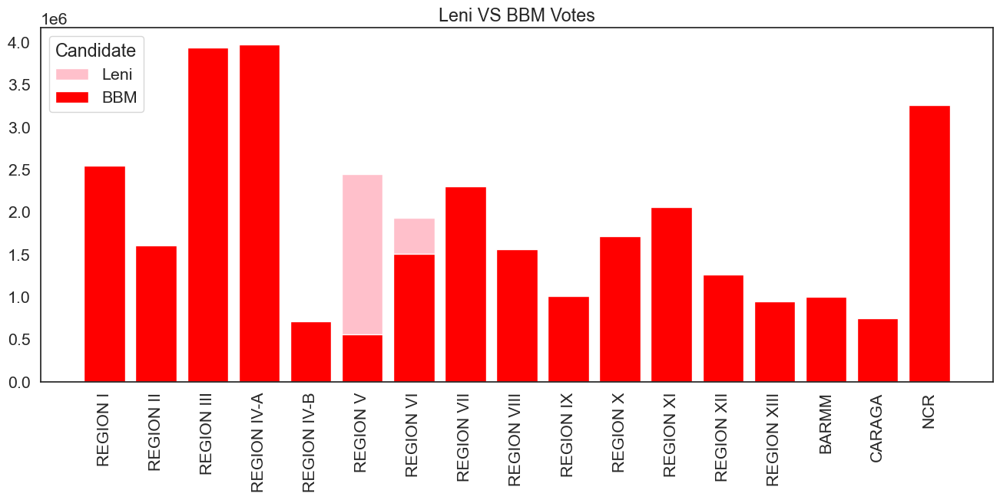

In [76]:
## redefine region
label_reg = df_reg_educ_tbl['Region'].copy()
label_reg[15] = 'CARAGA'
label_reg[16] = 'NCR'

plt.figure(figsize=(16, 6))

plt.bar(x = label_reg, 
        height = df_reg_educ_tbl['ROBREDO, LENI (IND)'], 
        label = 'Leni',
        color = 'pink')

plt.bar(x = label_reg, 
        height = df_reg_educ_tbl['MARCOS, BONGBONG (PFP)'], 
        label = 'BBM',
        color = 'red')
plt.xticks(label_reg, 
           rotation='vertical')

plt.title("Leni VS BBM Votes")
plt.legend(title="Candidate")
plt.show()

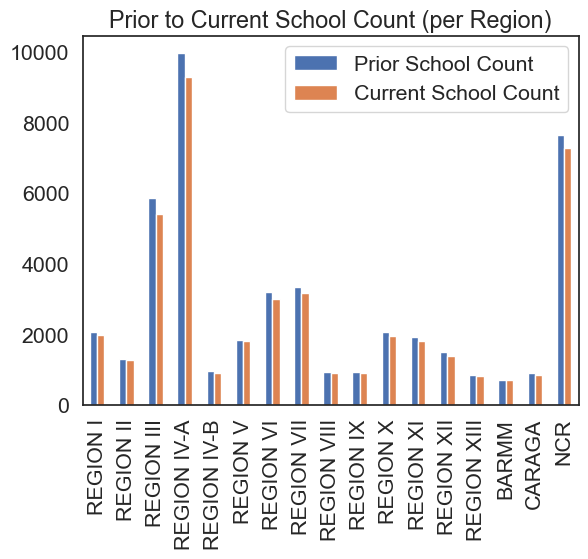

In [77]:
school_count_combi.loc[:,['Region','Prior School Count','Current School Count']].set_index(label_reg).plot.bar()

plt.title("Prior to Current School Count (per Region)")
plt.xlabel('')
plt.show()

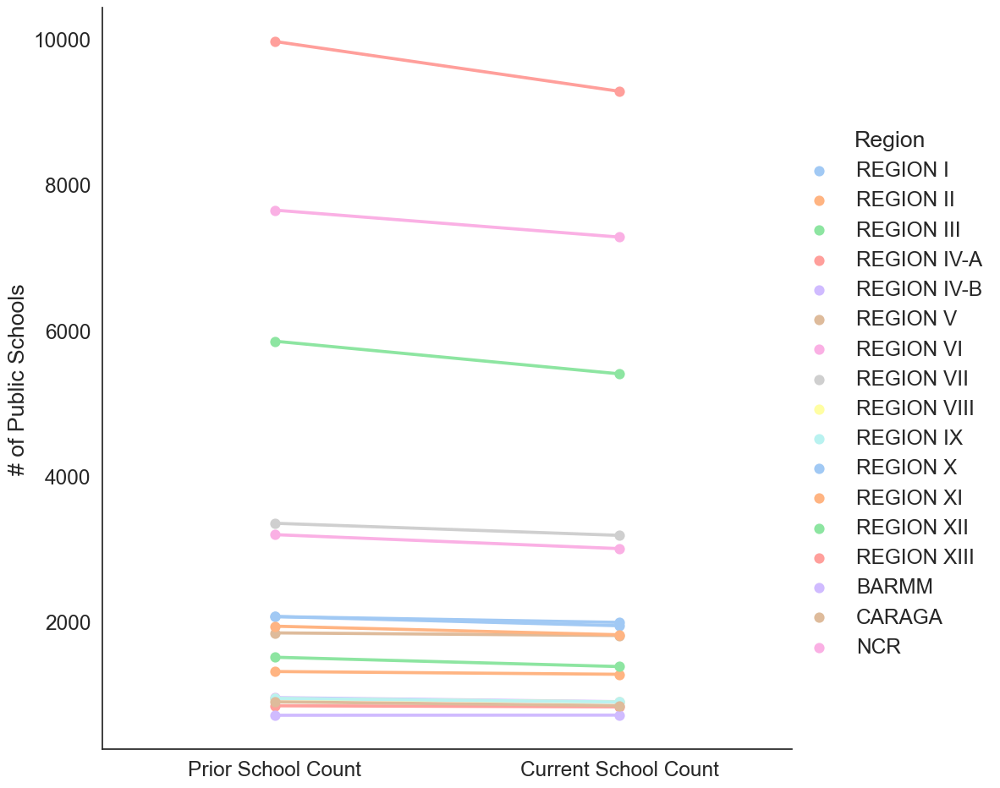

In [78]:
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False


#fig = plt.figure(figsize = (14,14))
sns.set(style='white', font_scale = 1.6)

school_count_tbl_1_factor = school_count_combi.loc[:,['Region','Prior School Count','Current School Count']]
school_count_tbl_1_factor['Region'] = label_reg

school_count_tbl_2_factor = school_count_tbl_1_factor.melt(id_vars = ['Region'], 
                                                           var_name = 'School Year', 
                                                           value_name = 'School Count')


sns.factorplot(data=school_count_tbl_2_factor, 
               x = 'School Year', 
               y = 'School Count',
               hue = 'Region',
               palette = sns.color_palette("pastel",len(school_count_tbl_2_factor)),
               size = 10)

# plt.ylim(0,4*10**6)
# plt.xticks(rotation = 90)
# plt.yticks(rotation = 90)
plt.xlabel('')
plt.ylabel('# of Public Schools')
plt.show()

In [79]:
# top 3 regions based on current school count
school_count_tbl_1_factor_top = school_count_tbl_1_factor.groupby('Region')['Current School Count'].sum().sort_values(ascending=False)[:5]
school_count_tbl_1_factor_top = school_count_tbl_1_factor_top.reset_index()
school_count_tbl_1_factor_top_list = list(school_count_tbl_1_factor_top.iloc[:,0])
school_count_tbl_1_factor_top_list

['REGION IV-A', 'NCR', 'REGION III', 'REGION VII', 'REGION VI']

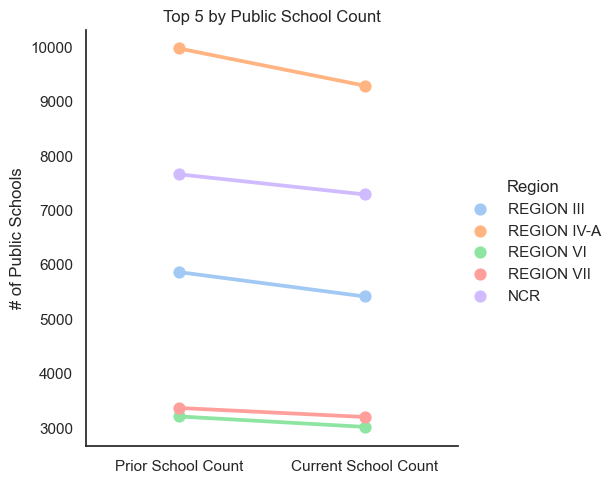

In [80]:
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False


#fig = plt.figure(figsize = (14,14))
sns.set(style='white', font_scale = 1.)

school_count_tbl_1_factor_top = school_count_combi.loc[:,['Region','Prior School Count','Current School Count']]
school_count_tbl_1_factor_top['Region'] = label_reg[label_reg.isin(school_count_tbl_1_factor_top_list)]
school_count_tbl_1_factor_top = school_count_tbl_1_factor_top[school_count_tbl_1_factor_top['Region'].isin(school_count_tbl_1_factor_top_list)]


school_count_tbl_2_factor_top = school_count_tbl_1_factor_top.melt(id_vars = ['Region'], 
                                                           var_name = 'School Year', 
                                                           value_name = 'School Count')


sns.factorplot(data=school_count_tbl_2_factor_top, 
               x = 'School Year', 
               y = 'School Count',
               hue = 'Region',
               palette = sns.color_palette("pastel",len(school_count_tbl_2_factor)),
               linewidth = 2,
               size = 5)

# plt.ylim(0,4*10**6)
# plt.xticks(rotation = 90)
# plt.yticks(rotation = 90)
plt.title('Top 5 by Public School Count')
plt.xlabel('')
plt.ylabel('# of Public Schools')
plt.show()

In [81]:
(school_count_tbl_1_factor.iloc[:,2].sum() / school_count_tbl_1_factor.iloc[:,1].sum() - 1) * 100

-5.640580966832864

In [82]:
# region proportion

school_count_tbl_1_factor.loc[school_count_tbl_1_factor['Region'].isin(school_count_tbl_1_factor_top_list),'Current School Count'].sum() / school_count_tbl_1_factor['Current School Count'].sum()

0.6468939533174048

In [83]:
per_reg_votes = df.groupby(['reg','candidate_name'])['votes'].sum().reset_index()
per_reg_votes

,reg,candidate_name,votes
0,BARMM,"ABELLA, ERNIE (IND)",3312
1,BARMM,"DE GUZMAN, LEODY (PLM)",1375
2,BARMM,"DOMAGOSO, ISKO MORENO (AKSYON)",53619
3,BARMM,"GONZALES, NORBERTO (PDSP)",2889
4,BARMM,"LACSON, PING (PDR)",5385
5,BARMM,"MANGONDATO, FAISAL (KTPNAN)",157887
6,BARMM,"MARCOS, BONGBONG (PFP)",1003781
7,BARMM,"MONTEMAYOR, JOSE JR. (DPP)",1062
8,BARMM,"PACQUIAO, MANNY PACMAN(PROMDI)",36382
9,BARMM,"ROBREDO, LENI (IND)",430941


In [84]:
top_votes = per_reg_votes.loc[per_reg_votes['reg'].isin(['REGION IV-A', 'NATIONAL CAPITAL REGION', 'REGION III', 'REGION VII', 'REGION VI']),'votes'].sum()
top_votes / per_reg_votes.loc[:,'votes'].sum()

0.5220334167247065

In [85]:
# pct of Leni votes in these top 5
per_reg_cand_votes = df.groupby(['reg','candidate_name'])['votes'].sum().reset_index()

num = per_reg_cand_votes.loc[(per_reg_cand_votes['candidate_name'] == 'ROBREDO, LENI (IND)') & (per_reg_cand_votes['reg'].isin(['REGION IV-A', 'NATIONAL CAPITAL REGION', 'REGION III', 'REGION VII', 'REGION VI'])),'votes'].sum()
den = per_reg_cand_votes.loc[per_reg_cand_votes['reg'].isin(['REGION IV-A', 'NATIONAL CAPITAL REGION', 'REGION III', 'REGION VII', 'REGION VI']),'votes'].sum()
num / den

0.3229861698031682

In [86]:
per_reg_cand_votes_leni = df.groupby(['reg','candidate_name'])['votes'].sum().reset_index()
per_reg_cand_votes_leni = per_reg_cand_votes_leni[per_reg_cand_votes_leni['candidate_name'] == 'ROBREDO, LENI (IND)']
per_reg_cand_votes_leni

,reg,candidate_name,votes
9,BARMM,"ROBREDO, LENI (IND)",430941
19,CORDILLERA ADMINISTRATIVE REGION,"ROBREDO, LENI (IND)",88501
29,NATIONAL CAPITAL REGION,"ROBREDO, LENI (IND)",1804153
39,OAV,"ROBREDO, LENI (IND)",90174
49,REGION I,"ROBREDO, LENI (IND)",329491
59,REGION II,"ROBREDO, LENI (IND)",167837
69,REGION III,"ROBREDO, LENI (IND)",1631217
79,REGION IV-A,"ROBREDO, LENI (IND)",2636869
89,REGION IV-B,"ROBREDO, LENI (IND)",529121
99,REGION IX,"ROBREDO, LENI (IND)",262108


In [87]:
per_reg_leni = df.groupby(['reg'])['votes'].sum().reset_index()
per_reg_leni

,reg,votes
0,BARMM,1696633
1,CORDILLERA ADMINISTRATIVE REGION,895766
2,NATIONAL CAPITAL REGION,5850415
3,OAV,452259
4,REGION I,3008174
5,REGION II,1862455
6,REGION III,6075581
7,REGION IV-A,7450564
8,REGION IV-B,1594092
9,REGION IX,1706105


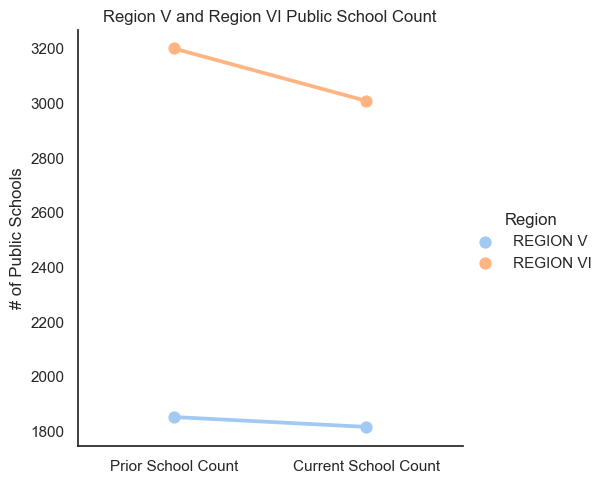

In [88]:
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False


#fig = plt.figure(figsize = (14,14))
sns.set(style='white', font_scale = 1.)

school_count_tbl_1_factor_reg5and6 = school_count_combi.loc[:,['Region','Prior School Count','Current School Count']]
school_count_tbl_1_factor_reg5and6 = school_count_tbl_1_factor_reg5and6[school_count_tbl_1_factor_reg5and6['Region'].isin(['REGION V','REGION VI'])]
school_count_tbl_1_factor_reg5and6

school_count_tbl_2_factor_reg5and6 = school_count_tbl_1_factor_reg5and6.melt(id_vars = ['Region'], 
                                                           var_name = 'School Year', 
                                                           value_name = 'School Count')


sns.factorplot(data  =school_count_tbl_2_factor_reg5and6, 
               x = 'School Year', 
               y = 'School Count',
               hue = 'Region',
               palette = sns.color_palette("pastel",len(school_count_tbl_2_factor)),
               linewidth = 2,
               size = 5)

# plt.ylim(0,4*10**6)
# plt.xticks(rotation = 90)
# plt.yticks(rotation = 90)
plt.title('Region V and Region VI Public School Count')
plt.xlabel('')
plt.ylabel('# of Public Schools')
plt.show()

In [89]:
school_count_tbl_1_factor_reg5and6 = school_count_combi.loc[:,['Region','Prior School Count','Current School Count']]
school_count_tbl_1_factor_reg5and6 = school_count_tbl_1_factor_reg5and6[school_count_tbl_1_factor_reg5and6['Region'].isin(['REGION V','REGION VI'])]
school_count_tbl_1_factor_reg5and6

,Region,Prior School Count,Current School Count
5,REGION V,1850,1814
6,REGION VI,3198,3006


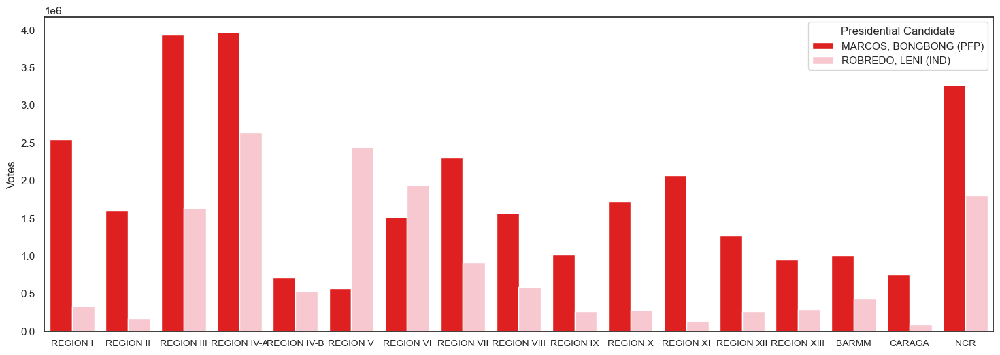

In [90]:
df_plot = df.copy()

df_plot = df_plot.groupby(['reg','candidate_name'])['votes'].sum('votes').reset_index()

df_plot['reg'] = pd.Categorical(df_plot['reg'],
                              categories=regions_in_df)

rcParams['axes.prop_cycle'] = cycler(color=['red','pink'])

plt.figure(figsize=(18, 6))#, facecolor='black')
g = sns.barplot(x = 'reg', 
            hue = 'candidate_name', 
            y = 'votes', 
            data = df_plot[df_plot['candidate_name'].isin(['ROBREDO, LENI (IND)','MARCOS, BONGBONG (PFP)'])],
            ci = None)

#g.set_facecolor('black') 

plt.xlabel('')
plt.ylabel('Votes')
plt.legend(title = 'Presidential Candidate')



g.set_xticklabels(label_reg, fontsize = 10)
plt.show()

## Dashboard Stuff

In [91]:
df['votes'].sum() # compare with powerbi number

52911948